In [1]:
import numpy as np
import glob
import skimage
import skimage.io
import skimage.transform
import matplotlib.pyplot as plt
import os
from scipy.optimize import curve_fit
from sklearn.decomposition import PCA
import random
from data import Dataset
from tqdm import tqdm

### input import

In [2]:
exp=17

if exp==11: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_11/analysis/data2_12mixed_tr19.pkl")
if exp==12: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_12/analysis/data2_32mixed_tr21.pkl")
if exp==13: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_13/analysis/data2_select_tr1.pkl")
if exp==17: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_17/analysis/data2_41mixed_tr28.pkl")
if exp==19: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_19/analysis/data2_28mixed_tr35.pkl")
if exp==101: dataset = Dataset.load("/media/samuele/BC_Samuele/20190523_goodone/analyses/flashed_images/fi/data.pkl")
if exp==102: dataset = Dataset.load("/media/samuele/Samuele_01/Salamander2/data2_23mixed_tr34.pkl")

dataset.select_cells('all')
train_x, train_y = dataset.train()
val_x, val_y = dataset.val()
test_x, test_y = dataset.test(averages=False)

#here I reshape the pickle outputs that have a weird 1
train_x=train_x[:,:,:,0]
val_x=val_x[:,:,:,0]
test_x=test_x[:,:,:,0]

train_y.shape

(2910, 41)

### note that here the images are shifted and rescaled and so the gray images would be of all zeros

In [3]:
#I create the "true" gaussian filter function that my fitting procedure should retrieve

x, y = np.meshgrid(np.linspace(0,108,108), np.linspace(0,108,108))
def gaussian_filt(x,y,x0,y0,sx,sy,theta,amp):
    x1=x*np.cos(theta)-y*np.sin(theta)-x0*np.cos(theta)+y0*np.sin(theta)
    y1=y*np.cos(theta)+x*np.sin(theta)-y0*np.cos(theta)-x0*np.sin(theta)
    return amp*np.exp(-((x1**2. / (2. * sx**2.) + (y1)**2. / (2. * sy**2.))))

#then I create a function that computes the responses of the cell given a certain filter

def contrast_model(images,x0,y0,sx,sy,theta,amp,l_0):
    responses=np.zeros((images.shape[0]))
    x, y = np.meshgrid(np.linspace(0,108,108), np.linspace(0,108,108))
    filter_ = gaussian_filt(x,y,x0,y0,sx,sy,theta,amp)
    for i in range(images.shape[0]):
        responses[i]= np.dot(((images[i]-l_0)**2).flatten(), filter_.flatten())
        
    return responses

#this is the function that computes the lsta prediction of the contrast model with l_0 as free param
def contrast_model_lstas(images,x0,y0,dx,dy,theta,amp,l_0):
    ctr_lstas=np.zeros(images.shape)
    x, y = np.meshgrid(np.linspace(0,108,108), np.linspace(0,108,108))
    filt=gaussian_filt(x,y,x0,y0,dx,dy,theta,amp)
    for i in range(images.shape[0]):
        ctr_lstas[i]=2*(images[i]-l_0)*filt
    return ctr_lstas

#this is the function that computes the lsta prediction of the contrast model with l_0 as LSTA*image
def contrast_model_dotlstas(images,x0,y0,dx,dy,theta,amp):
    ctr_lstas=np.zeros(images.shape)
    x, y = np.meshgrid(np.linspace(0,108,108), np.linspace(0,108,108))
    filt=gaussian_filt(x,y,x0,y0,dx,dy,theta,amp)
    for i in range(images.shape[0]):
        l_0=np.dot(LSTAs_set[i].flatten(),images[i].flatten())  #/LSTAs_set[i].sum()
        ctr_lstas[i]=2*(images[i]-l_0)*filt
    return ctr_lstas

#this is the function that computes the lsta prediction of the contrast model with l_0 as binned_LSTA*binned_image
def contrast_model_dotlstas_binned(images,x0,y0,dx,dy,theta,amp):
    ctr_lstas=np.zeros(images.shape)
    x, y = np.meshgrid(np.linspace(0,108,108), np.linspace(0,108,108))
    filt=gaussian_filt(x,y,x0,y0,dx,dy,theta,amp)
    for i in range(images.shape[0]):
        l_0=np.dot(binned_lstas[i].flatten(),images[i].flatten())  #/LSTAs_set[i].sum()
        ctr_lstas[i]=2*(images[i]-l_0)*filt
    return ctr_lstas

#here I want to fit the contrast model on the responses of the cell but with an l_0 that is given by the dot 
#product

def contrast_model2(images,x0,y0,sx,sy,theta,amp):
    responses=np.zeros((images.shape[0]))
    x, y = np.meshgrid(np.linspace(0,108,108), np.linspace(0,108,108))
    filter_ = gaussian_filt(x,y,x0,y0,sx,sy,theta,amp)
    for i in range(images.shape[0]):
        l_0=np.dot(LSTAs_set[i].flatten(),images[i].flatten())
        responses[i]= np.dot(((images[i]-l_0)**2).flatten(), filter_.flatten())
        
    return responses

def contrast_model_lstas_2(images,x0,y0,dx,dy,theta,amp,l_0):
    res=contrast_model_lstas(images,x0,y0,dx,dy,theta,amp,l_0)
    return res.flatten()

def contrast_model_lstas_3(images,x0,y0,dx,dy,theta,amp):
    res=contrast_model_dotlstas(images,x0,y0,dx,dy,theta,amp)
    return res.flatten()

def contrast_model_lstas_4(images,x0,y0,dx,dy,theta,amp):
    res=contrast_model_dotlstas_binned(images,x0,y0,dx,dy,theta,amp)
    return res.flatten()

In [4]:
def random_search(function,input_, target, rn_nb,dot=False,method='lm'):  #'trf','dogbox'
    x0_range=np.arange(10,80,1)
    y0_range=np.arange(10,80,1)
    dx0_range=np.arange(-50,50,.1)
    dy0_range=np.arange(-50,50,.1)
    theta0_range=np.arange(-1.5,1.5,0.01)
    amp0_range=np.arange(0,50,.1)
    l0_range=np.arange(0,5,0.01)

    points=[]
    for run in range(rn_nb):
        x0=random.choice(x0_range)
        y0=random.choice(y0_range)
        dx0=random.choice(dx0_range)
        dy0=random.choice(dy0_range)
        theta0=random.choice(theta0_range)
        amp0=random.choice(amp0_range)
        l0=random.choice(l0_range)
        try:
            if dot:
                best_vals9, covar9 = curve_fit(function, input_, target, p0=[x0,y0,dx0,dy0,theta0,amp0],method=method)
                trial=contrast_model_lstas(binned_imgs,*best_vals9)
                points.append(np.append(best_vals9,((trial.flatten()-binned_lstas.flatten())**2).sum() ))
            else:
                best_vals9, covar9 = curve_fit(function, input_, target, p0=[x0,y0,dx0,dy0,theta0,amp0,l0],method=method)
                trial=contrast_model_lstas(binned_imgs,*best_vals9)
                points.append(np.append(best_vals9,((trial.flatten()-binned_lstas.flatten())**2).sum() ))
        except:
            if dot:
                points.append(np.append(np.zeros(6),10000 ))
            else:
                points.append(np.append(np.zeros(7),10000 ))
        print(run/rn_nb*100)

    points=np.array(points)
    #print(points.shape,points.argmin(),points[:,-1].min())
    return points[points[:,-1].argmin(),:]

## Charge the LSTAs

In [3]:
if exp==11: results_folder= "/media/samuele/Samuele_01/Exp_11/analysis/cnn_12mixed_tr19/run_019"
if exp==12: results_folder= '/media/samuele/Samuele_01/Exp_12/analysis/cnn_32mixed_tr21/run_060/'
if exp==13: results_folder= '/media/samuele/Samuele_01/Exp_13/analysis/cnn_9OFF_tr1/run_097/'
if exp==17: results_folder= '/media/samuele/Samuele_01/Exp_17/analysis/cnn_41mixed_tr28_repeat/run_026'
if exp==19: results_folder="/media/samuele/Samuele_01/Exp_19/analysis/cnn_28mixed_tr35/run_019"
if exp==101:results_folder= '/media/samuele/BC_Samuele/20190523_goodone/analyses/cnn_sys_ident/20200616_025316/run_075/'
if exp==102:results_folder='/media/samuele/Samuele_01/Salamander2/cnn_23mixed_tr34/run_030'

train_lstas=np.load(os.path.join(results_folder, 'train_lstas.npy'))
train_lstas.shape

#charging the LSTAs that were generated through the model for each image of the training set

(41, 2910, 108, 108)

In [4]:
exp

17

In [9]:
# # np.save('/media/samuele/Samuele_01/modelling_output_forMatias/LSTAs_forPCAcourse.npy',train_lstas[39])
# np.save('/media/samuele/Samuele_01/modelling_output_forMatias/Images_forPCAcourse.npy',train_x)


In [5]:
#Let's focus on a cell
cell=39

base=train_lstas[cell]

LSTAs_set=base.reshape(base.shape[0], base.shape[1]*base.shape[2])

#resp=train_y[:,cell]  #measured response of a single cell

#this will be the target of the fitting of the contrast model

[0.44969493 0.20198102]


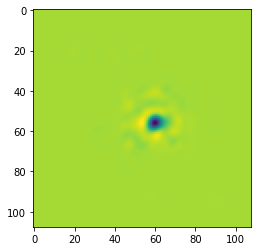

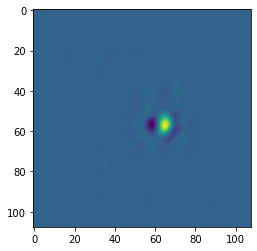

In [6]:
#do a PCA on the collection of the predicted LSTAs for the single cell
pca = PCA(n_components=2)  #n_components=2
pca.fit(LSTAs_set)

#check that the PCA worked and that only the first two components could be retained
print(pca.explained_variance_ratio_)

plt.figure()
plt.imshow(pca.components_[0].reshape(108,108))
plt.figure()
plt.imshow(pca.components_[1].reshape(108,108))
#visualize those components  (I flip and transpose them in order for them to be comparable with the STA)
# plt.figure()
# plt.imshow(pca.components_[0].reshape(base.shape[1],base.shape[2])[::-1,::-1].transpose())
# plt.figure()
# plt.imshow(pca.components_[1].reshape(base.shape[1],base.shape[2])[::-1,::-1].transpose())

PC1=pca.components_[0]
PC2=pca.components_[1]

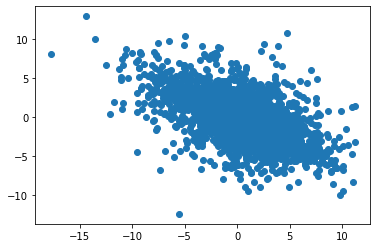

In [7]:
#project all the images of the training set on the PCs

PC1=pca.components_[0]
PC2=pca.components_[1]

resh_training=train_x.reshape(train_x.shape[0], train_x.shape[1]*train_x.shape[2])
#resh_val=val_x.reshape(val_x.shape[0], val_x.shape[1]*val_x.shape[2])
project=[]
for image in resh_training:
    project.append([np.dot(PC1,image),np.dot(PC2,image)])
project=np.array(project)    

pt_x=project[:,0]
pt_y=project[:,1]
plt.figure()
plt.scatter(pt_x,pt_y)

(-20.0, 20.0)

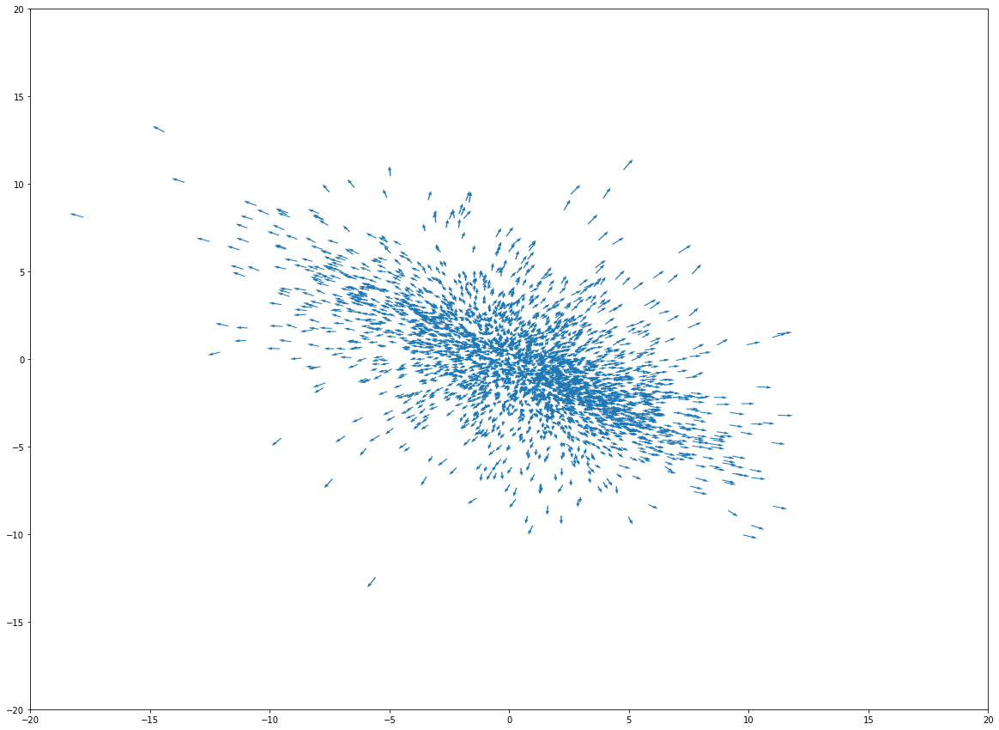

In [8]:
#project also the LSTAs on the same components

arrowheads=[]
for image in LSTAs_set:
    arrowheads.append([np.dot(PC1,image),np.dot(PC2,image)])
arrowheads=np.array(arrowheads)

dx=arrowheads[:,0]
dy=arrowheads[:,1]

#and plot them as arrows
plt.figure(figsize=(20,15))
for i,j in enumerate(pt_x[:3500]):
    plt.arrow(j,pt_y[i],dx[i],dy[i],width=0.05,lw=0)
span=20
plt.xlim([-span,span])
plt.ylim([-span,span])

(-20.0, 20.0)

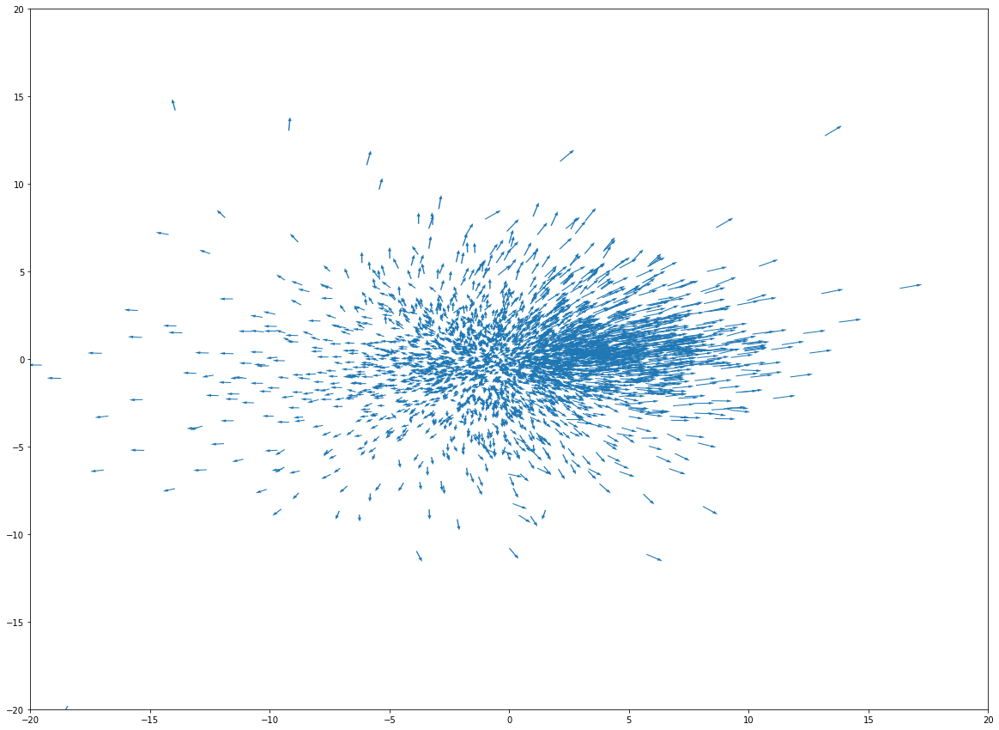

In [27]:
# #matlab principal components trial
# from scipy.io import loadmat

# PC3 = loadmat('/media/samuele/Samuele_01/PC1.mat')['Pict'].T.flatten()*-1
# PC4 = loadmat('/media/samuele/Samuele_01/PC2.mat')['Pict'].T.flatten()*-1

# resh_training=train_x.reshape(train_x.shape[0], train_x.shape[1]*train_x.shape[2])
# project=[]
# for image in resh_training:
#     project.append([np.dot(PC3,image),np.dot(PC4,image)])
# project=np.array(project)
# pt_x=project[:,0]
# pt_y=project[:,1]

# arrowheads=[]
# for image in LSTAs_set:
#     arrowheads.append([np.dot(PC3,image),np.dot(PC4,image)])
# arrowheads=np.array(arrowheads)

# dx=arrowheads[:,0]
# dy=arrowheads[:,1]

# #and plot them as arrows
# plt.figure(figsize=(20,15))
# for i,j in enumerate(pt_x):
#     plt.arrow(j,pt_y[i],dx[i],dy[i],width=0.05,lw=0)
# span=20
# plt.xlim([-span,span])
# plt.ylim([-span,span])

# # plt.figure()
# # plt.imshow(PC3[::-1].T*-1)
# # plt.figure()
# # plt.imshow(PC4[::-1].T*-1)
# # plt.figure()
# # plt.imshow(pca.components_[0].reshape(108,108))
# # plt.figure()
# # plt.imshow(pca.components_[1].reshape(108,108))

In [40]:
# print(PC2)
# print(PC4)
# plt.figure()
# plt.imshow(PC3.reshape(108,108))
# plt.figure()
# plt.imshow(PC4.reshape(108,108))

## Different approaches were tried. It was tried to fit the model on the responses instead of the lstas and it was tried to pass the l_0 as a dot product instead of making it a free parameter. it was tried not to bin the stimulus space. Those approaches though did not work. So the stimulus space is binned, l_0 is gven as a free parameter and the model is fitted to reproduce the lstas, not the responses

### Principal components space discretization

In [9]:
x_bins=31   # of arrows I want along x    
y_bins=31  # of arrows I want along y
#dx=(pt_x.max()-pt_x.min())/x_bins   #bin size of x
#dy=(pt_y.max()-pt_y.min())/y_bins   #bin size of y
dx=40/x_bins
dy=40/x_bins

binned_imgs=[] #np.zeros((x_bins*y_bins,2))
binned_lstas=[]
bin_lims=[]
for x_tick in range(x_bins):
    #x_val=pt_x.min()+x_tick*dx
    x_val=-20+x_tick*dx
    for y_tick in range(y_bins):
        #y_val=pt_y.min()+y_tick*dy
        y_val=-20+y_tick*dy
        temp_img=np.zeros((108,108))
        temp_lsta=np.zeros((108,108))
        nb=0
        for i,img in enumerate(project):
            if x_val<=img[0]<x_val+dx and y_val<=img[1]<y_val+dy:
                temp_img+=train_x[i]
                temp_lsta+=base[i]
                nb+=1
        if nb==0:
            continue
#             binned_imgs.append(np.zeros((108,108)))
#             binned_lstas.append(np.zeros((108,108)))
        else:
            binned_imgs.append(temp_img/nb)
            binned_lstas.append(temp_lsta/nb)
            bin_lims.append([x_val,x_val+dx,y_val, y_val+dy])

binned_imgs=np.array(binned_imgs)
binned_lstas=np.array(binned_lstas)

(-12.0, 12.0)

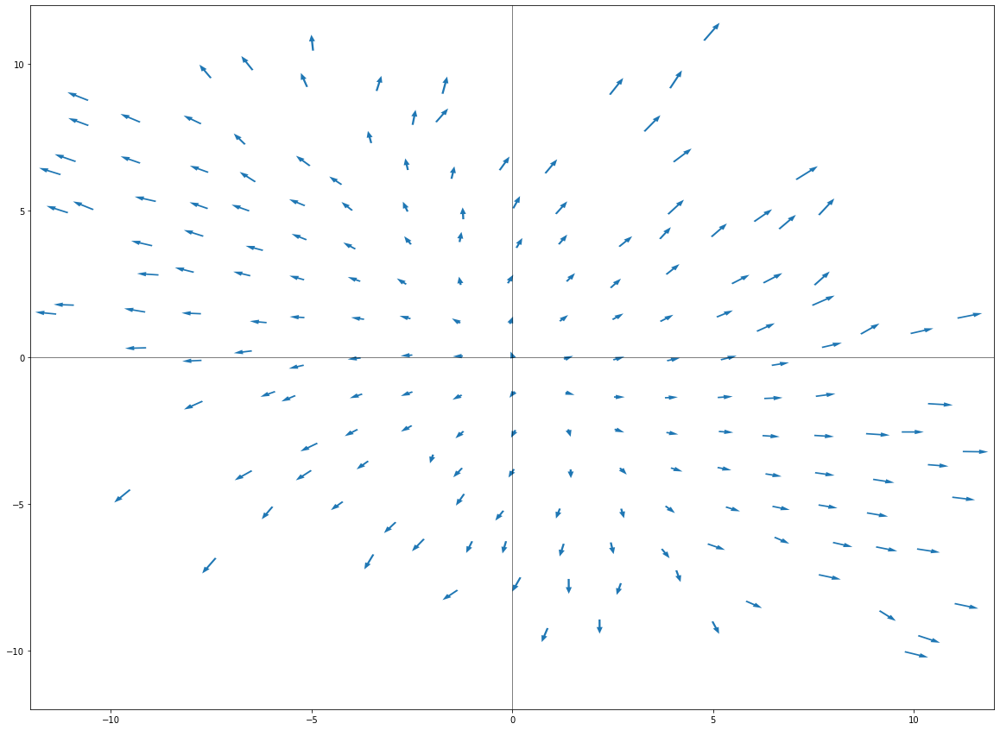

In [10]:
resh_binned_imgs=binned_imgs.reshape(binned_imgs.shape[0],binned_imgs.shape[1]*binned_imgs.shape[2])
resh_binned_lstas=binned_lstas.reshape(binned_lstas.shape[0],binned_lstas.shape[1]*binned_lstas.shape[2])

binned_arrowtails=[]
for bin_img in resh_binned_imgs:
    binned_arrowtails.append([np.dot(PC1,bin_img),np.dot(PC2,bin_img)])
binned_arrowtails=np.array(binned_arrowtails)

binned_arrowheads=[]
for bin_lsta in resh_binned_lstas:
    binned_arrowheads.append([np.dot(PC1,bin_lsta),np.dot(PC2,bin_lsta)])
binned_arrowheads=np.array(binned_arrowheads)


plt.figure(figsize=(20,15))
for i,j in enumerate(binned_arrowtails[:,0]):
    plt.arrow(j,binned_arrowtails[i,1],binned_arrowheads[i,0],binned_arrowheads[i,1],width=0.05,lw=0)
    
plt.axvline(0,color='k',lw=0.5)
plt.axhline(0,color='k',lw=0.5)
span=12
plt.xlim([-span,span])
plt.ylim([-span,span])

### I discretize the space in order to avoid that the arrows that are more frequent will bias my parameters estimation

0.0
10.0
20.0


/home/samuele/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


30.0
40.0
50.0
60.0
70.0
80.0
90.0
[6.21076184e+01 5.64899858e+01 3.82765304e+00 2.70322055e+00
 2.48399850e-02 1.71423881e-02 2.46486284e-02 7.40754346e+00]


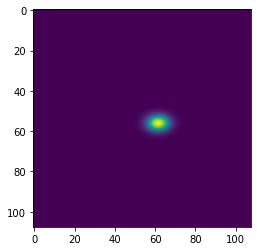

In [49]:
#here I give l_0 as a free parameter and train the model on the lstas

# init_vals6 = [68, 54, 20,20,0,5,0.1]
# best_vals6, covar6 = curve_fit(contrast_model_lstas_2, binned_imgs, binned_lstas.flatten(), p0=init_vals6,method='trf')
best_vals6=random_search(contrast_model_lstas_2,binned_imgs,binned_lstas.flatten(),10)
print(best_vals6)

x, y = np.meshgrid(np.linspace(0,108,108), np.linspace(0,108,108))
plt.figure()
plt.imshow(gaussian_filt(x,y,*best_vals6[:-2]))

In [50]:
#ctr_lastas6=contrast_model_lstas(binned_imgs,*best_vals6[:-1],-.025)
ctr_lastas6=contrast_model_lstas(binned_imgs,*best_vals6[:-1])
#ctr_lastas6[ctr_lastas6 < 0.00001] = 0

(-17.5, 17.5)

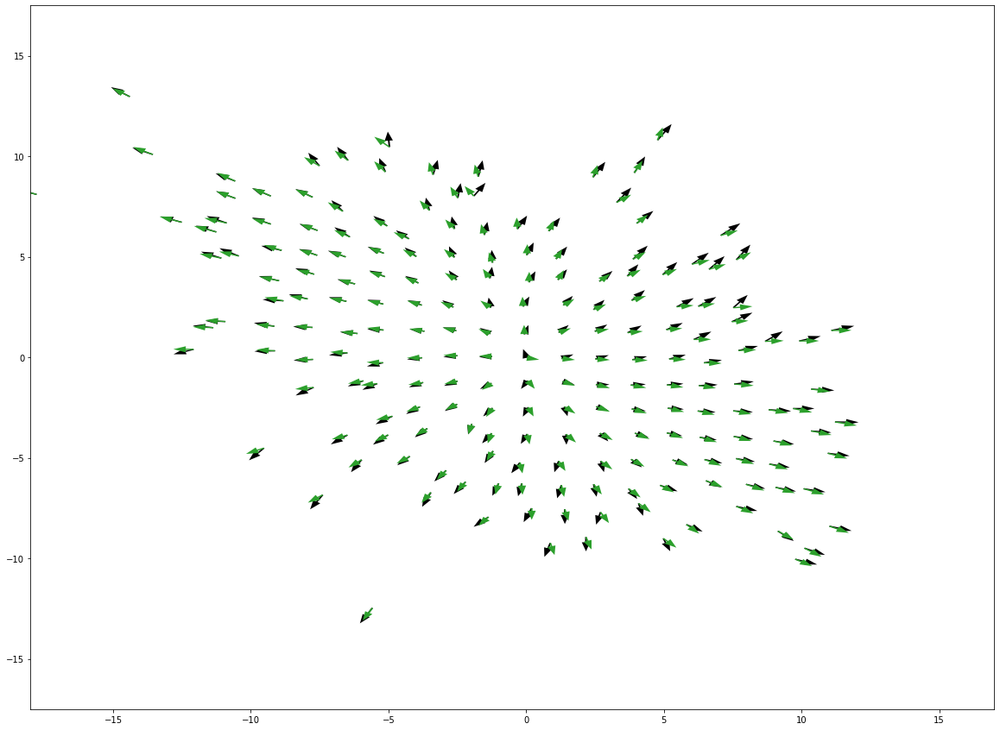

In [51]:
mod6_lasta_set=ctr_lastas6.reshape(ctr_lastas6.shape[0], ctr_lastas6.shape[1]*ctr_lastas6.shape[2])

model_arrows6=[]
for ctr_lsta in mod6_lasta_set:
    model_arrows6.append([np.dot(PC1,ctr_lsta),np.dot(PC2,ctr_lsta)])
    #model_arrows2.append([np.dot(PC3,ctr_lsta),np.dot(PC4,ctr_lsta)])
model_arrows6=np.array(model_arrows6)

dx_mod6=model_arrows6[:,0]
dy_mod6=model_arrows6[:,1]

plt.figure(figsize=(20,15))
for i,j in enumerate(binned_arrowtails[:,0]):
    plt.arrow(j,binned_arrowtails[i,1],binned_arrowheads[i,0],binned_arrowheads[i,1],width=0.06,color='black',head_width=5*0.06,lw=0)
    plt.arrow(j,binned_arrowtails[i,1],dx_mod6[i],dy_mod6[i],width=0.06, color='C2',head_width=5*0.06,lw=0)
    
plt.xlim([-18,17])
plt.ylim([-17.5,17.5])

In [ ]:
#start the evaluation code
# try the double layer of optimization
#find the mouse cell that is best represented by the contrast model(for 11 the lsta have to be generated)
#adjust also the Baptist model (or eliminate it adding a couple of commented lines to this notebook)

In [18]:
def corrcoef(x, y):
    """Return Pearson product-moment correlations coefficients.

    This is a wrapper around `np.corrcoef` to avoid:
        `RuntimeWarning: invalid value encountered in true_divide`.
    """

    assert len(x) > 0, len(x)
    assert len(y) > 0, len(y)
    assert len(x) == len(y), (len(x), len(y))

    is_x_deterministic = np.all(x == x[0])  # i.e. array filled with a unique value
    is_y_deterministic = np.all(y == y[0])  # i.e. array filled with a unique value
    if is_x_deterministic and is_y_deterministic:
        r = 1.0
    elif is_x_deterministic or is_y_deterministic:
        r = 0.0
    else:
        r = np.corrcoef(x, y)[0, 1]

    return r

## Evaluation of the CNN model on the data

In [84]:
#test_y=(# reps,# images,# cells)
print(test_x.shape,test_y.shape)
#test_y containes the real responses of the cell to the testing set

cnn_test_predictions=np.load(os.path.join(results_folder, 'test_predictions.npy'))
#these are the CNN results on the testing set
cnn_test_predictions=np.mean(cnn_test_predictions,axis=0)
#I average across repetitions because the model is not stochastic and so for the same image gives always the same prediction
print(cnn_test_predictions.shape)

even_test_y = np.mean(test_y[0::2, :, :], axis=0)  # mean over even repetitions
odd_test_y = np.mean(test_y[1::2, :, :], axis=0)  # mean over odd repetitions
reliabilities = []
accuracies_o = []
accuracies_e = []
nb_cells=test_y.shape[-1]
for cell_nb in range(0, nb_cells):
    reliability = corrcoef(even_test_y[:, cell_nb], odd_test_y[:, cell_nb])
    accuracy_o = corrcoef(cnn_test_predictions[:, cell_nb], odd_test_y[:, cell_nb])
    accuracy_e = corrcoef(cnn_test_predictions[:, cell_nb], even_test_y[:, cell_nb])
    reliabilities.append(reliability)
    accuracies_o.append(accuracy_o)
    accuracies_e.append(accuracy_e)
reliabilities = np.array(reliabilities)
accuracies_o = np.array(accuracies_o)
accuracies_e = np.array(accuracies_e)

max_explainable_var=2/(1+np.sqrt(1/reliabilities**2))
#the variance in the true data that is explainable. The unexplainable part is due to noise

nc_cnn_predicted_variance=(0.5*(accuracies_o+accuracies_e))/np.sqrt(reliabilities)
#the variance that is actually explained by the model

cnn_performance=nc_cnn_predicted_variance/max_explainable_var
#the percentage of explainable variance that is explained by the model

(30, 108, 108) (30, 30, 41)
(30, 41)


In [36]:
cnn_performance.mean()

0.7674385500344145

## Evaluation of the contrast model on the data

In [85]:
contr_test_predictions=contrast_model(test_x,*best_vals6[:-1])

In [86]:
even_test_y_ss = np.mean(test_y[0::2, :, cell], axis=0)  # mean over even repetitions for one cell
odd_test_y_ss = np.mean(test_y[1::2, :, cell], axis=0)  # mean over odd repetitions  for one cell

reliability_ss = corrcoef(even_test_y_ss, odd_test_y_ss)
accuracy_o_ss = corrcoef(contr_test_predictions, odd_test_y_ss)
accuracy_e_ss = corrcoef(contr_test_predictions, even_test_y_ss)

max_explainable_var_ss=2/(1+np.sqrt(1/reliability_ss))
#the variance in the true data that is explainable. The unexplainable part is due to noise

nc_contr_predicted_variance=(0.5*(accuracy_o_ss+accuracy_e_ss))/np.sqrt(reliability_ss)
#the variance that is actually explained by the model

contr_performance=nc_contr_predicted_variance/max_explainable_var_ss
#the percentage of explainable variance that is explained by the model

In [71]:
contr_performance

0.5542266347120587

## Evaluation of the contrast model with respect to the CNN

In [87]:
cross_model_accuracy = corrcoef(contr_test_predictions, cnn_test_predictions[:,cell])
cross_model_accuracy

0.5872430801405554

## Plot the fitted arrow graph with performances evaluations

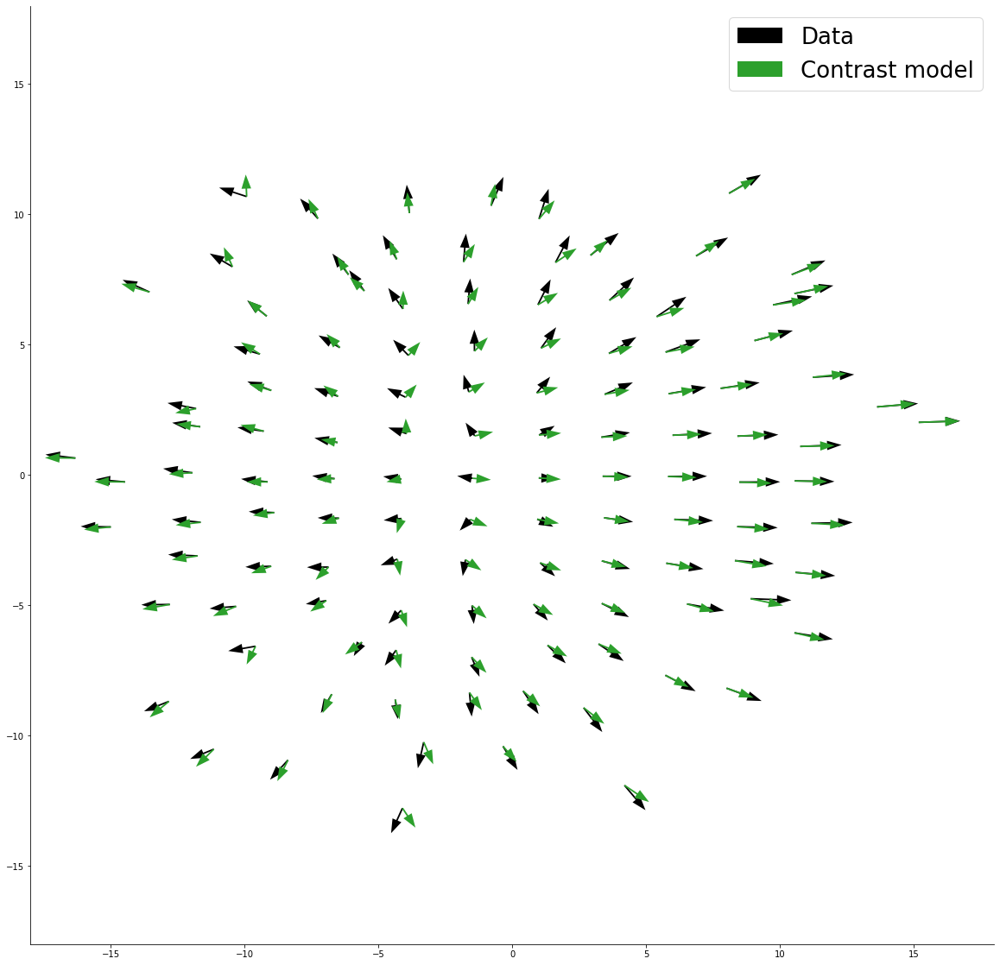

In [67]:
#previous version of the plotting code

# Plotting_folder='/home/samuele/Data_analysis/Contrast_Model_output/'
# #the folder in which the plot is to be saved

# fig, ax = plt.subplots(figsize=(20,20))
# #plt.figure(figsize=(20,15))
# for i,j in enumerate(binned_arrowtails[:,0]):
#     if i==0:
#         ax.arrow(j,binned_arrowtails[i,1],binned_arrowheads[i,0],binned_arrowheads[i,1],width=0.06,color='black',head_width=6*0.06,lw=0,label='Data')
#         ax.arrow(j,binned_arrowtails[i,1],dx_mod6[i],dy_mod6[i],width=0.06, color='C2',head_width=6*0.06,lw=0,label='Contrast model')
#     else:
#         ax.arrow(j,binned_arrowtails[i,1],binned_arrowheads[i,0],binned_arrowheads[i,1],width=0.06,color='black',head_width=6*0.06, lw=0,label=None)
#         ax.arrow(j,binned_arrowtails[i,1],dx_mod6[i],dy_mod6[i],width=0.06, color='C2',head_width=6*0.06, lw=0,label=None)

# #plt.title("The CNN model explains {0:.2f} of the explainable variance in the test set data, while the contrast model explains {1:.2f} of it.\n The contrast model explains {2:.2f} of the variance predicted by the CNN".format(cnn_performance[cell],contr_performance,cross_model_accuracy))
# ax.set_xlim([-18,18])
# ax.set_ylim([-18,18])

# ax.spines['right'].set_visible(False)
# ax.spines['top'].set_visible(False)
# ax.legend(prop={'size': 26})
# #plt.axvline(0,color='k',lw=0.5)
# #plt.axhline(0,color='k',lw=0.5)

# # plt.savefig(Plotting_folder+'Arrowgraph_cell1029_Exp102')
# # plt.legend()
# # plt.show()    

# #fig.tight_layout()
# fig.savefig(Plotting_folder+'Arrowgraph_cell1029_Exp102',format='pdf')
# plt.show()

# #ax.spines['bottom'].set_visible(False)
# #ax.spines['left'].set_visible(False)

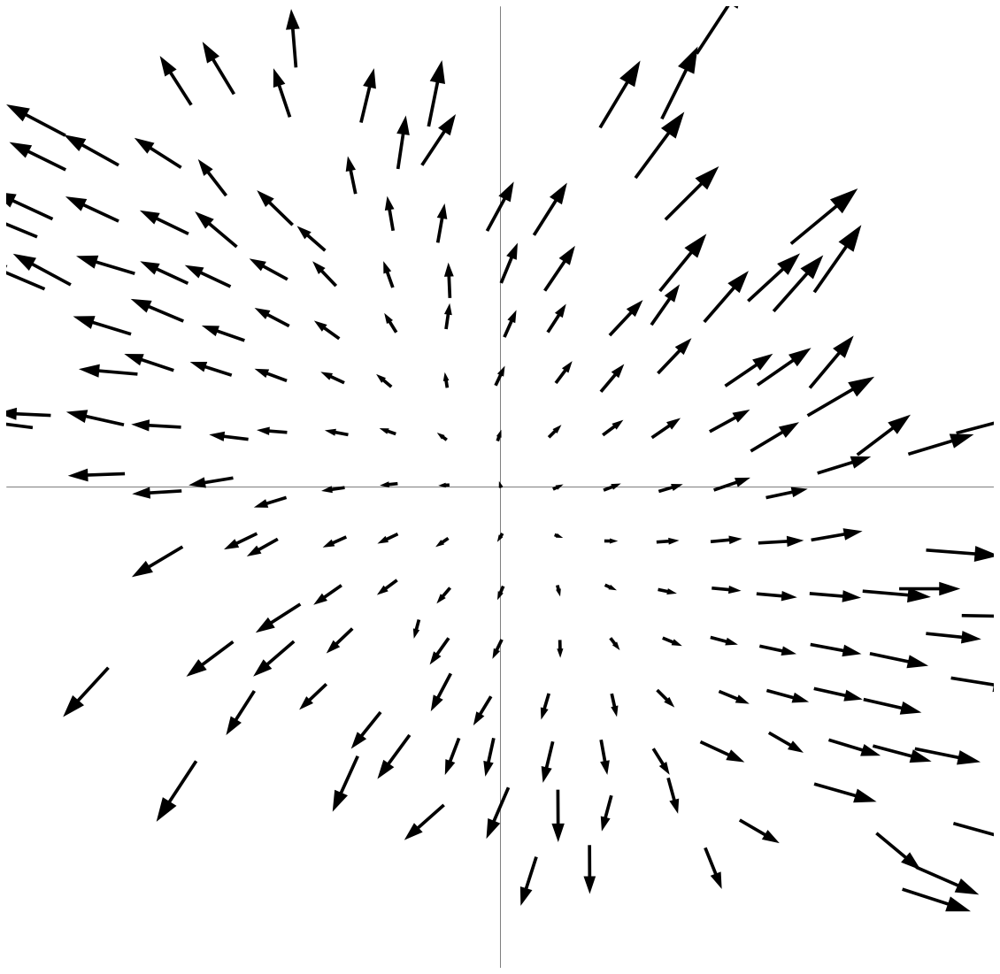

In [14]:
Plotting_folder='/home/samuele/Data_analysis/Figures/'
#the folder in which the plot is to be saved

min_arrow= 0.1
mult_arrow=0.75    #0.35
arrowsize=  3.0

fig, ax = plt.subplots(figsize=(20,20))
#plt.figure(figsize=(20,15))
for i,j in enumerate(binned_arrowtails[:,0]):
    if i==0:
        ax.arrow(j,binned_arrowtails[i,1],binned_arrowheads[i,0]*arrowsize,binned_arrowheads[i,1]*arrowsize,width=0.08,color='black',head_width=min_arrow+mult_arrow*np.sqrt(binned_arrowheads[i,0]**2+binned_arrowheads[i,1]**2),lw=0,label='Data')
#         ax.arrow(j,binned_arrowtails[i,1],dx_mod6[i]*arrowsize,dy_mod6[i]*arrowsize,width=0.08, color='C2',head_width=min_arrow+mult_arrow*np.sqrt(dx_mod6[i]**2+dy_mod6[i]**2),lw=0,label='Contrast model')
    else:
        ax.arrow(j,binned_arrowtails[i,1],binned_arrowheads[i,0]*arrowsize,binned_arrowheads[i,1]*arrowsize,width=0.08,color='black',head_width=min_arrow+mult_arrow*np.sqrt(binned_arrowheads[i,0]**2+binned_arrowheads[i,1]**2), lw=0,label=None)
#         ax.arrow(j,binned_arrowtails[i,1],dx_mod6[i]*arrowsize,dy_mod6[i]*arrowsize,width=0.08, color='C2',head_width=min_arrow+mult_arrow*np.sqrt(dx_mod6[i]**2+dy_mod6[i]**2), lw=0,label=None)

#plt.title("The CNN model explains {0:.2f} of the explainable variance in the test set data, while the contrast model explains {1:.2f} of it.\n The contrast model explains {2:.2f} of the variance predicted by the CNN".format(cnn_performance[cell],contr_performance,cross_model_accuracy))

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
# ax.legend(prop={'size': 26})
plt.axvline(0,color='k',lw=0.5)
# plt.axvline(-10,color='k',lw=0.5)
# plt.axvline(-1,color='k',lw=0.5)
# plt.axvline(7,color='k',lw=0.5)
# plt.axhline(10,color='k',lw=0.5)
plt.axhline(0,color='k',lw=0.5)
ax.set_xticks([])
# ax.set_xticklabels(['','',''])
ax.set_yticks([])
# ax.set_yticklabels(['','',''])
# ax.xaxis.set_tick_params(size=8,width=3)
# ax.yaxis.set_tick_params(size=8,width=3)

xlim=12

ax.set_xlim([-xlim,xlim])
ax.set_ylim([-xlim,xlim])

# plt.savefig(Plotting_folder+'Arrowgraph_cell1029_Exp102')
# plt.legend()
# plt.show()    

#fig.tight_layout()
fig.savefig(Plotting_folder+'Plain_arrowgraph_cell39_Exp17_zoomed.pdf',format='pdf')
plt.show()



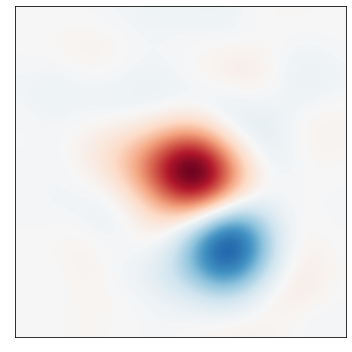

In [53]:
#I will save here the principal components of the cell of interest 

#visualize those components  (I flip and transpose them in order for them to be comparable with the STA)
Plotting_folder='/home/samuele/Data_analysis/Figures/'

zoom=11  #9 for mouse

PC=pca.components_[1].reshape(base.shape[1],base.shape[2])*-1
#y_max=int(np.abs(PC).argmax()/108)
#x_max=int(np.abs(PC).argmax()%108)
y_max=36
x_max=52
expon_treat = 2
PC=np.sign(PC)*np.exp(np.log(abs(PC)*expon_treat))

vmax= np.max([np.amax(PC),-np.amin(PC)]) 

cmap='RdBu_r'
interp='bicubic'
# plt.imshow(PC,cmap=cmap,vmax=vmax,vmin=-vmax,interpolation=interp)
# plt.axvline(51,color='k',lw=0.5)
# plt.axvline(69,color='k',lw=0.5)
fig, ax = plt.subplots(figsize=(5,5))
ax.imshow(PC[y_max-zoom:y_max+zoom, x_max-zoom:x_max+zoom],cmap=cmap,vmax=vmax,vmin=-vmax,interpolation=interp)

ax.set_xticks([])
ax.set_xticklabels([])
ax.set_yticks([])
ax.set_yticklabels([])
ax.xaxis.set_tick_params(size=8,width=3)
ax.yaxis.set_tick_params(size=8,width=3)   

fig.tight_layout()
fig.savefig(Plotting_folder+'PC2_cell871_Exp101_inverted.pdf',format='pdf')
plt.show()

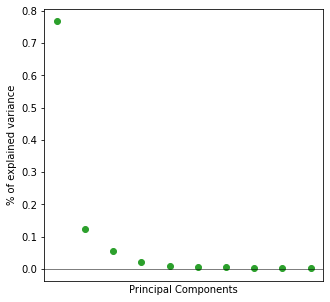

In [68]:
#here I will save the spectrum of the PCA

spectrum=np.array(pca.explained_variance_ratio_)

fig, ax = plt.subplots(figsize=(5,5))
ax.plot(spectrum[:10], 'o', color='C2')
ax.axhline(0,color='k',lw=0.5)
ax.set_xlabel('Principal Components')
ax.set_ylabel('% of explained variance')
ax.set_xticks([])
ax.set_xticklabels([])
#ax.set_yticks([])
plt.show()
fig.savefig('/home/samuele/Data_analysis/Figures/spectrum_cell3_Exp101.pdf',format='pdf')

(-12.0, 12.0)

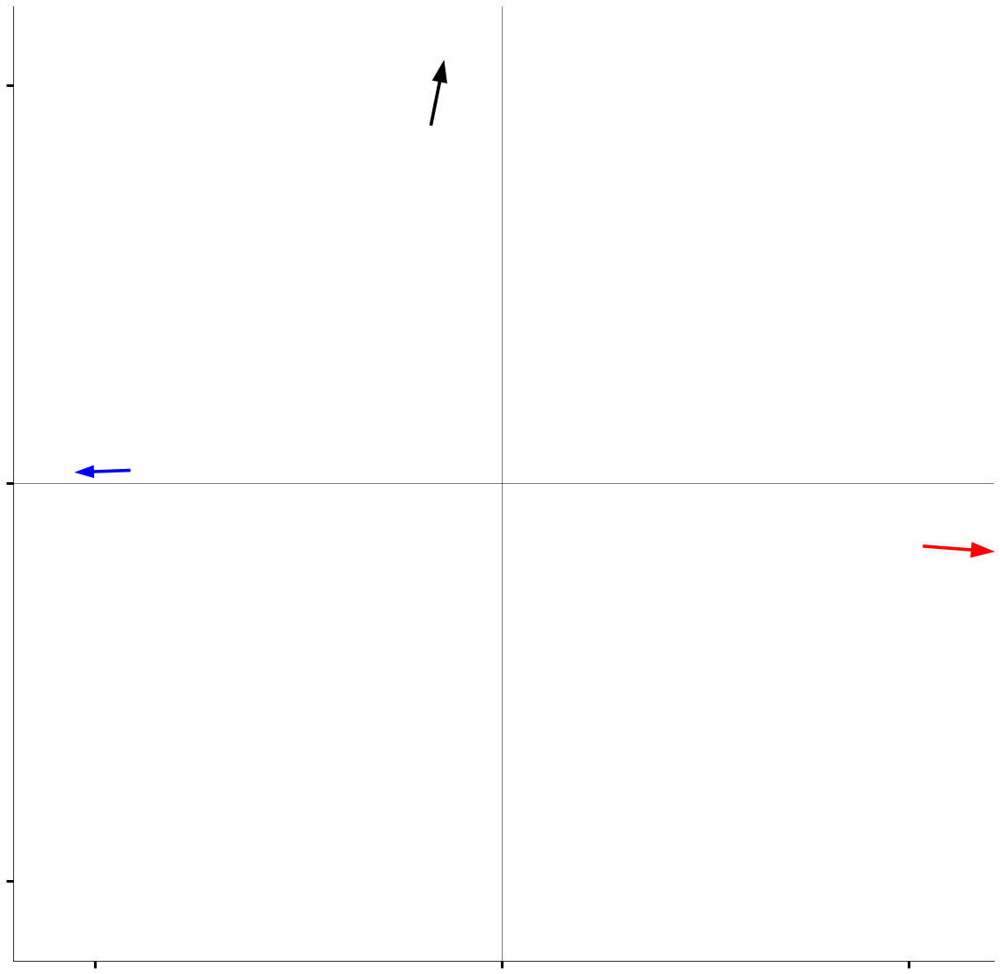

In [12]:
# in this cell I select three arrows (bins) and for each of them I select one of the images that fall inside the 
# bin and its CNN predicted LSTA

min_arrow= 0.1
mult_arrow=0.75    #0.35
arrowsize=  3.0

fig, ax = plt.subplots(figsize=(20,20))

bin_idx1=92
ax.arrow(binned_arrowtails[bin_idx1,0],binned_arrowtails[bin_idx1,1],binned_arrowheads[bin_idx1,0]*arrowsize,binned_arrowheads[bin_idx1,1]*arrowsize,width=0.08,color='black',head_width=min_arrow+mult_arrow*np.sqrt(binned_arrowheads[bin_idx1,0]**2+binned_arrowheads[bin_idx1,1]**2),lw=0)

bin_idx2=14
ax.arrow(binned_arrowtails[bin_idx2,0],binned_arrowtails[bin_idx2,1],binned_arrowheads[bin_idx2,0]*arrowsize,binned_arrowheads[bin_idx2,1]*arrowsize,width=0.08,color='blue',head_width=min_arrow+mult_arrow*np.sqrt(binned_arrowheads[bin_idx2,0]**2+binned_arrowheads[bin_idx2,1]**2),lw=0)

bin_idx3=189
ax.arrow(binned_arrowtails[bin_idx3,0],binned_arrowtails[bin_idx3,1],binned_arrowheads[bin_idx3,0]*arrowsize,binned_arrowheads[bin_idx3,1]*arrowsize,width=0.08,color='red',head_width=min_arrow+mult_arrow*np.sqrt(binned_arrowheads[bin_idx3,0]**2+binned_arrowheads[bin_idx3,1]**2),lw=0)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.axvline(0,color='k',lw=0.5)
plt.axhline(0,color='k',lw=0.5)
ax.set_xticks([-10,0,10])
ax.set_xticklabels(['','',''])
ax.set_yticks([-10,0,10])
ax.set_yticklabels(['','',''])
ax.xaxis.set_tick_params(size=8,width=3)
ax.yaxis.set_tick_params(size=8,width=3)

xlim=12

ax.set_xlim([-xlim,xlim+0.1])
ax.set_ylim([-xlim,xlim])
#fig.savefig(Plotting_folder+'3arrowgraph_cell39_Exp17.pdf',format='pdf')

<ipython-input-13-d97e9f05b66d>:28: RuntimeWarning: divide by zero encountered in log
  lsta=np.sign(base[img_idx])*np.exp(np.log(abs(base[img_idx])*expon_treat))


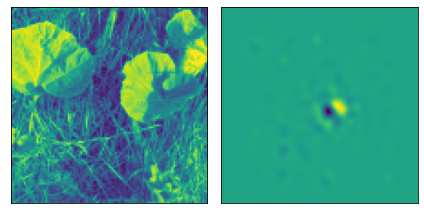

965


In [13]:
#image and lsta for arrow 1 (black)

#zoom=9

count=0
bin_lims=np.array(bin_lims)
for img_idx, proj in enumerate(project):
    RF_fit_folder = '/media/samuele/Samuele_01/Exp_17/analysis/RF_m1/'
    if bin_lims[bin_idx1,0]<=proj[0]<bin_lims[bin_idx1,1] and bin_lims[bin_idx1,2]<=proj[1]<bin_lims[bin_idx1,3]:
        count+=1
        if count==1:
        #if count>0:
            fig, (ax1, ax2) = plt.subplots(1, 2)
            y_max=int(np.abs(base[img_idx]).argmax()/108)
            x_max=int(np.abs(base[img_idx]).argmax()%108)
            #plt.figure(figsize=(20,20))
            #plt.subplot(1, 3, 1)
            #plt.imshow(train_x[img_idx])
            #ax1.imshow(train_x[img_idx][y_max-zoom:y_max+zoom, x_max-zoom:x_max+zoom])
            ax1.imshow(train_x[img_idx])
            ax1.set_xticks([])
            ax1.set_xticklabels([])
            ax1.set_yticks([])
            ax1.set_yticklabels([])
            
            
            expon_treat = 2
            lsta=np.sign(base[img_idx])*np.exp(np.log(abs(base[img_idx])*expon_treat))

            vmax= np.max([np.amax(lsta),-np.amin(lsta)]) 

            cmap='RdBu_r'
            interp='bicubic'
            #ax2.imshow(lsta[y_max-zoom:y_max+zoom, x_max-zoom:x_max+zoom],cmap=cmap,vmax=vmax,vmin=-vmax,interpolation=interp)
            ax2.imshow(lsta)

            ax2.set_xticks([])
            ax2.set_xticklabels([])
            ax2.set_yticks([])
            ax2.set_yticklabels([])

            fig.tight_layout()
            #fig.savefig(Plotting_folder+'PC2_cell1031_Exp17.pdf',format='pdf')
            plt.show()
#             plt.subplot(1, 3, 2)
#             plt.imshow(base[img_idx])
            np.save('/home/samuele/Data_analysis/Figures/lsta_blackarrow.npy', base[img_idx])
            print(img_idx)

2851


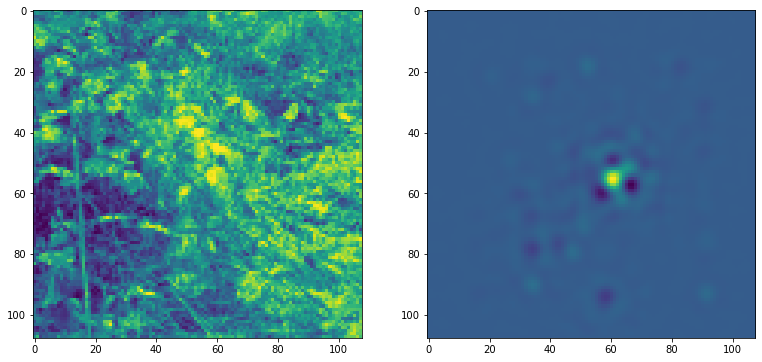

In [14]:
#image and lsta for arrow 2 (blue)
count=0
for img_idx, proj in enumerate(project):
    if bin_lims[bin_idx2,0]<=proj[0]<bin_lims[bin_idx2,1] and bin_lims[bin_idx2,2]<=proj[1]<bin_lims[bin_idx2,3]:
        count+=1
        if count==2:
            plt.figure(figsize=(20,20))
            plt.subplot(1, 3, 1)
            plt.imshow(train_x[img_idx])#[45:75,45:75])
            plt.subplot(1, 3, 2)
            plt.imshow(base[img_idx])#[45:75,45:75])
            np.save('/home/samuele/Data_analysis/Figures/lsta_bluearrow.npy', base[img_idx])
            print(img_idx)

763


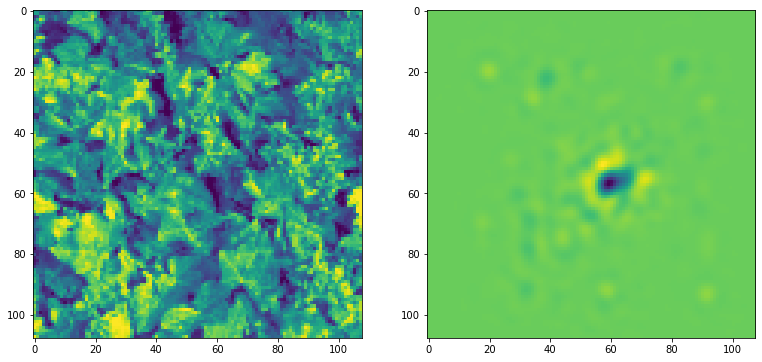

In [15]:
#image and lsta for arrow 3 (red)
count=0
for img_idx, proj in enumerate(project):
    if bin_lims[bin_idx3,0]<=proj[0]<bin_lims[bin_idx3,1] and bin_lims[bin_idx3,2]<=proj[1]<bin_lims[bin_idx3,3]:
        count+=1
        if count>0:
            plt.figure(figsize=(20,20))
            plt.subplot(1, 3, 1)
            plt.imshow(train_x[img_idx])  #[45:75,45:75])
            plt.subplot(1, 3, 2)
            plt.imshow(base[img_idx])   #[45:75,45:75])
            np.save('/home/samuele/Data_analysis/Figures/lsta_redarrow.npy', base[img_idx])
            print(img_idx)

In [51]:
project.shape

(2910, 2)

In [87]:
bin_lims=np.array(bin_lims)
bin_lims.shape

(194, 4)

In [55]:
base.shape

(2910, 108, 108)

In [54]:
train_x.shape

(2910, 108, 108)

# Plotting code for a non inverting cell

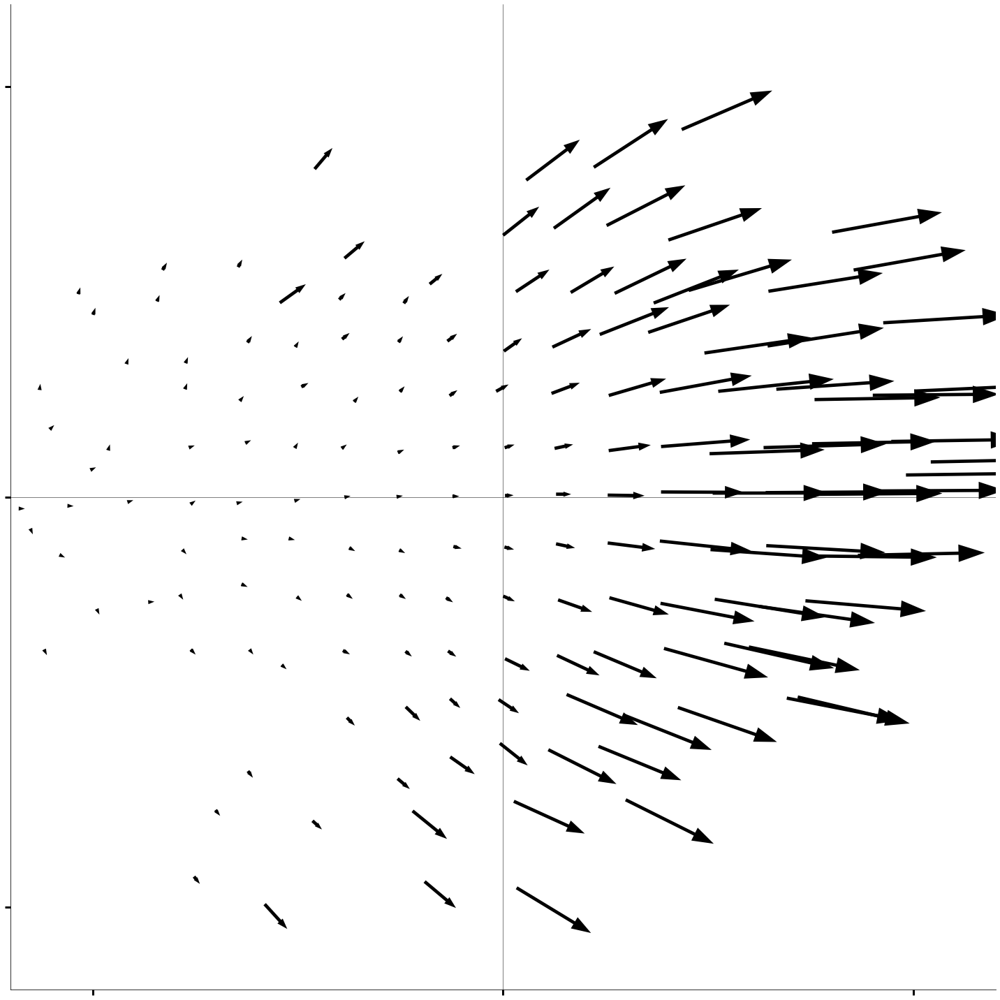

In [123]:
Plotting_folder='/home/samuele/Data_analysis/Figures/'
#the folder in which the plot is to be saved

min_arrow= 0.1
mult_arrow=0.2    #0.35
arrowsize=  1.5     #3.0

fig, ax = plt.subplots(figsize=(20,20))
for i,j in enumerate(binned_arrowtails[:,0]):
    if i==0:
        ax.arrow(j,binned_arrowtails[i,1],binned_arrowheads[i,0]*arrowsize,binned_arrowheads[i,1]*arrowsize,width=0.08,color='black',head_width=min_arrow+mult_arrow*np.sqrt(binned_arrowheads[i,0]**2+binned_arrowheads[i,1]**2),lw=0,label='Data')
        #ax.arrow(j,binned_arrowtails[i,1],dx_mod6[i]*arrowsize,dy_mod6[i]*arrowsize,width=0.08, color='C2',head_width=min_arrow+mult_arrow*np.sqrt(dx_mod6[i]**2+dy_mod6[i]**2),lw=0,label='Contrast model')
    else:
        ax.arrow(j,binned_arrowtails[i,1],binned_arrowheads[i,0]*arrowsize,binned_arrowheads[i,1]*arrowsize,width=0.08,color='black',head_width=min_arrow+mult_arrow*np.sqrt(binned_arrowheads[i,0]**2+binned_arrowheads[i,1]**2), lw=0,label=None)
        #ax.arrow(j,binned_arrowtails[i,1],dx_mod6[i]*arrowsize,dy_mod6[i]*arrowsize,width=0.08, color='C2',head_width=min_arrow+mult_arrow*np.sqrt(dx_mod6[i]**2+dy_mod6[i]**2), lw=0,label=None)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#ax.legend(prop={'size': 26})
plt.axvline(0,color='k',lw=0.5)
plt.axhline(0,color='k',lw=0.5)
ax.set_xticks([-10,0,10])
ax.set_xticklabels(['','',''])
ax.set_yticks([-10,0,10])
ax.set_yticklabels(['','',''])
ax.xaxis.set_tick_params(size=8,width=3)
ax.yaxis.set_tick_params(size=8,width=3)

xlim=12

ax.set_xlim([-xlim,xlim])
ax.set_ylim([-xlim,xlim])

# plt.savefig(Plotting_folder+'Arrowgraph_cell1029_Exp102')
# plt.legend()
# plt.show()    

fig.tight_layout()
fig.savefig(Plotting_folder+'Arrowgraph_cell9_Exp17_luminance.pdf',format='pdf')
plt.show()

#ax.spines['bottom'].set_visible(False)
#ax.spines['left'].set_visible(False)

# A cell that produces and saves the Contrast model figures for all the inverting cells of Salamander and mouse

  0%|                                                     | 0/2 [00:00<?, ?it/s]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 50%|██████████████████████                      | 1/2 [03:51<03:51, 231.82s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


  0%|                                                    | 0/22 [00:00<?, ?it/s]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


  5%|█▉                                         | 1/22 [02:09<45:09, 129.03s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


  9%|███▋                                     | 2/22 [06:02<1:03:34, 190.72s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 14%|█████▌                                   | 3/22 [10:34<1:12:02, 227.53s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 18%|███████▊                                   | 4/22 [12:44<56:45, 189.18s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 23%|█████████▊                                 | 5/22 [14:53<47:26, 167.42s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0


/home/samuele/anaconda3/envs/RFEst/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


70.0
80.0
90.0


 27%|███████████▋                               | 6/22 [16:42<39:23, 147.72s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 32%|█████████████▋                             | 7/22 [19:05<36:30, 146.05s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 36%|███████████████▋                           | 8/22 [21:23<33:28, 143.49s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 41%|█████████████████▌                         | 9/22 [23:42<30:47, 142.14s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 45%|███████████████████                       | 10/22 [26:15<29:06, 145.55s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 50%|█████████████████████                     | 11/22 [28:16<25:18, 138.03s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 55%|██████████████████████▉                   | 12/22 [30:12<21:51, 131.16s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 59%|████████████████████████▊                 | 13/22 [32:37<20:19, 135.50s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 64%|██████████████████████████▋               | 14/22 [35:15<18:57, 142.18s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 68%|████████████████████████████▋             | 15/22 [41:31<24:48, 212.59s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 73%|██████████████████████████████▌           | 16/22 [44:12<19:43, 197.20s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 77%|████████████████████████████████▍         | 17/22 [45:57<14:07, 169.45s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 82%|██████████████████████████████████▎       | 18/22 [48:08<10:31, 157.92s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


/tmp/ipykernel_403080/1378540584.py:140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(20,20))
 86%|████████████████████████████████████▎     | 19/22 [50:38<07:46, 155.43s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 91%|██████████████████████████████████████▏   | 20/22 [53:20<05:15, 157.58s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 95%|████████████████████████████████████████  | 21/22 [55:14<02:24, 144.43s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


  0%|                                                     | 0/7 [00:00<?, ?it/s]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 14%|██████▎                                     | 1/7 [03:15<19:35, 195.95s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 29%|████████████▌                               | 2/7 [04:54<11:34, 138.85s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 43%|██████████████████▊                         | 3/7 [07:45<10:13, 153.45s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 57%|█████████████████████████▏                  | 4/7 [10:04<07:22, 147.60s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 71%|███████████████████████████████▍            | 5/7 [11:56<04:29, 134.69s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 86%|█████████████████████████████████████▋      | 6/7 [14:37<02:23, 143.78s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


  0%|                                                     | 0/5 [00:00<?, ?it/s]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 20%|████████▊                                   | 1/5 [02:27<09:51, 147.95s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 40%|█████████████████▌                          | 2/5 [04:12<06:07, 122.35s/it]

0.0
10.0
20.0
30.0
40.0
50.0


/home/samuele/anaconda3/envs/RFEst/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


60.0
70.0
80.0
90.0


 60%|██████████████████████████▍                 | 3/5 [05:43<03:35, 107.95s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 80%|████████████████████████████████████         | 4/5 [07:03<01:36, 96.91s/it]

0.0


/home/samuele/anaconda3/envs/RFEst/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


  0%|                                                     | 0/4 [00:00<?, ?it/s]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 25%|███████████                                 | 1/4 [03:58<11:56, 238.74s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 50%|██████████████████████                      | 2/4 [07:38<07:34, 227.49s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


 75%|█████████████████████████████████           | 3/4 [08:50<02:36, 156.40s/it]

0.0
10.0
20.0
30.0
40.0
50.0
60.0
70.0
80.0
90.0


100%|████████████████████████████████████████████| 4/4 [11:30<00:00, 172.54s/it]


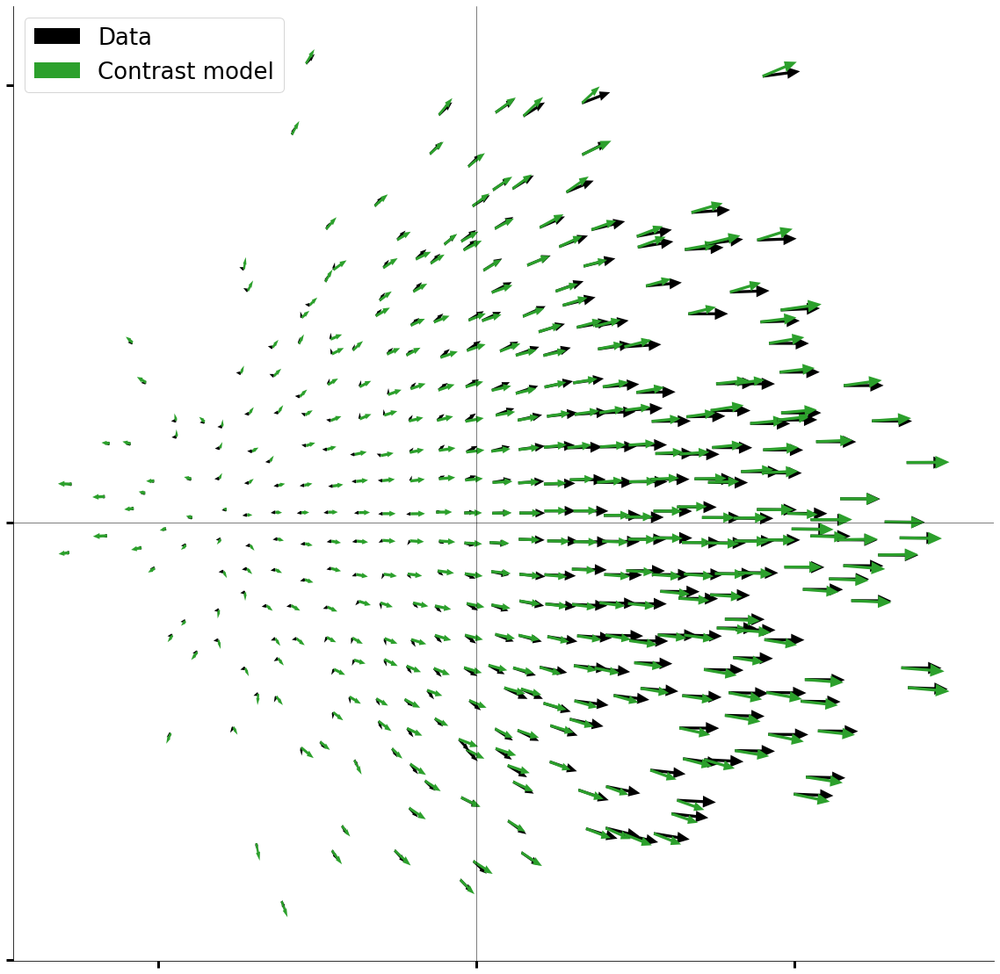

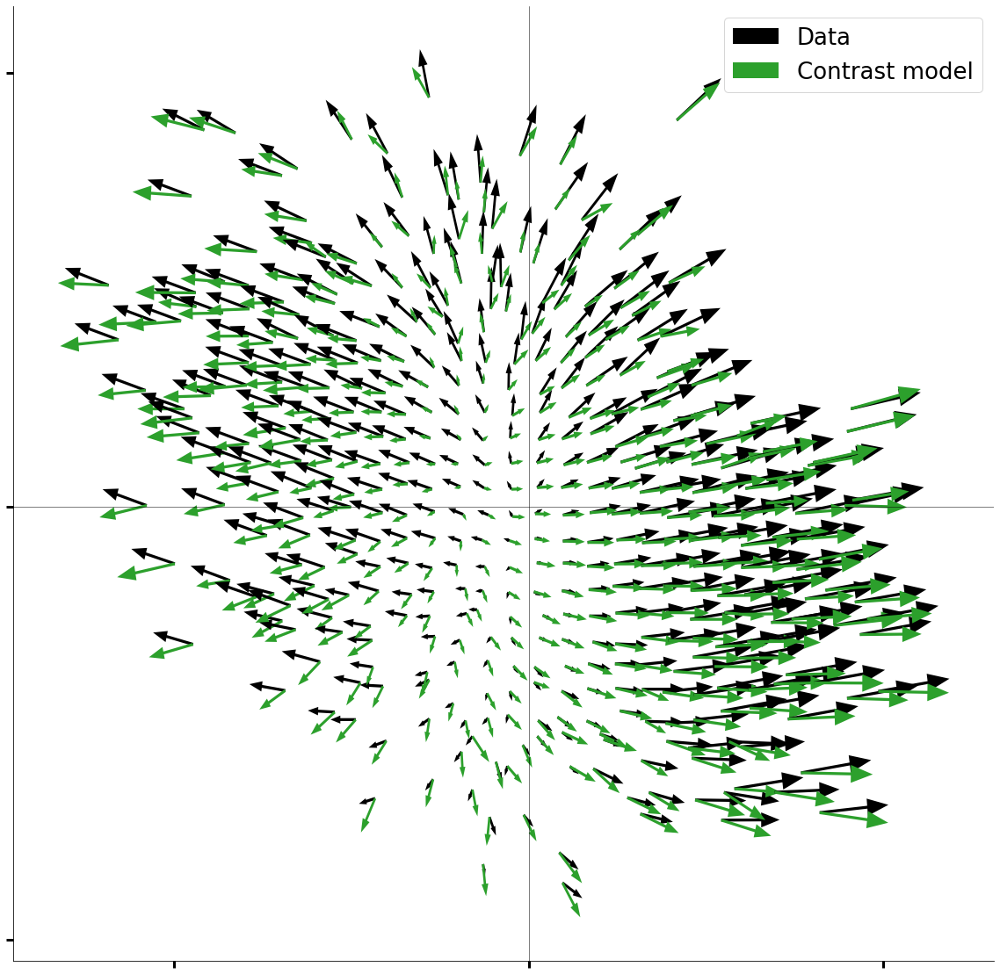

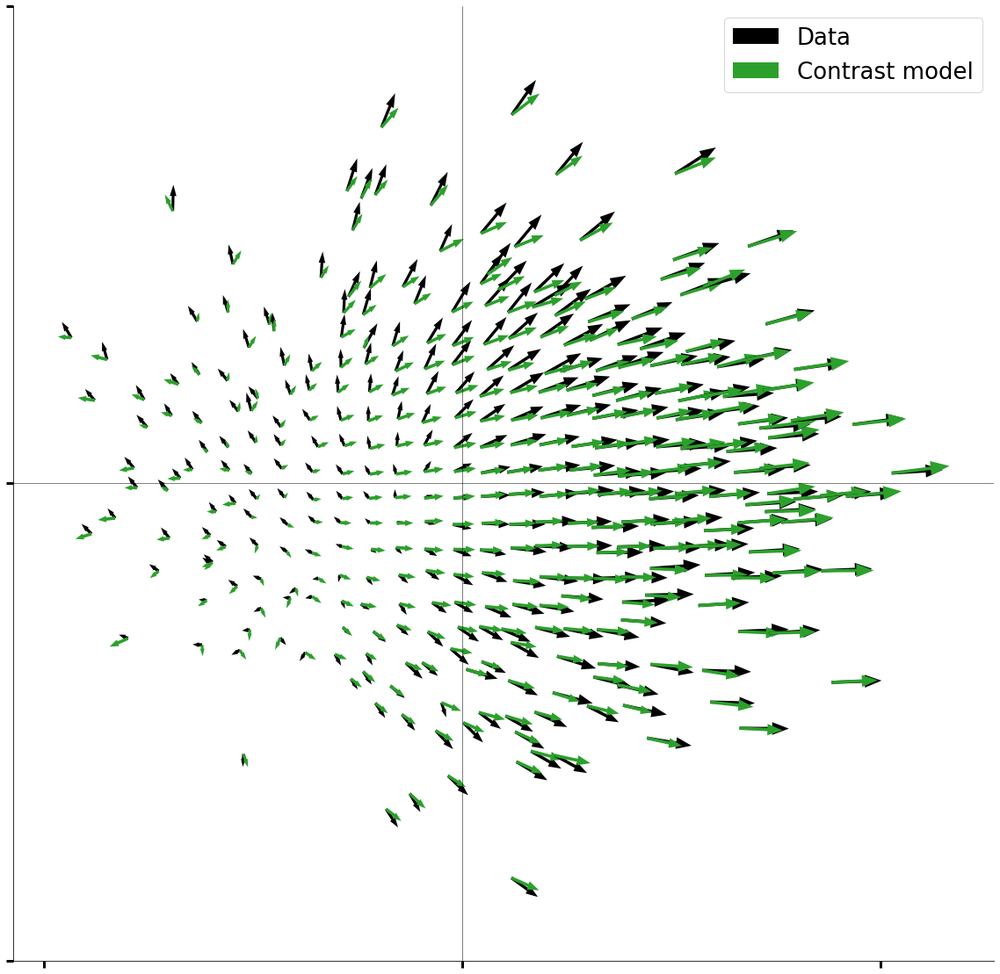

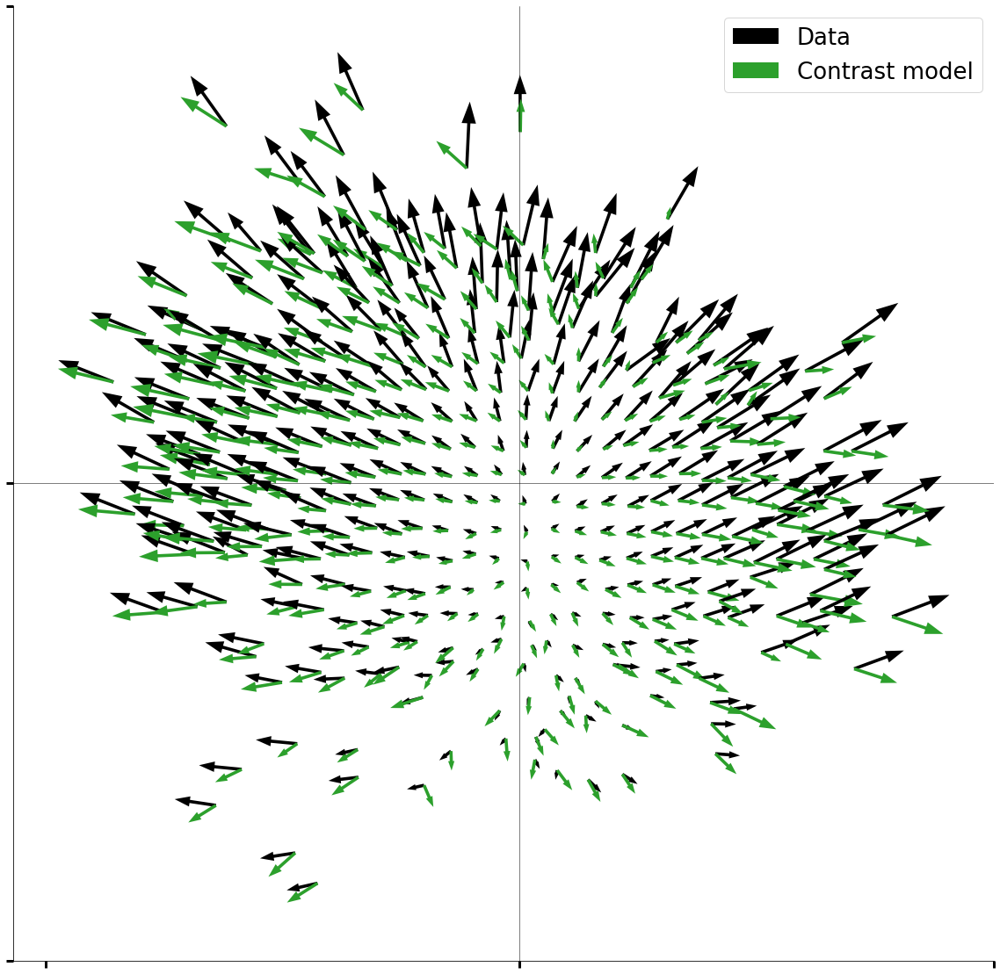

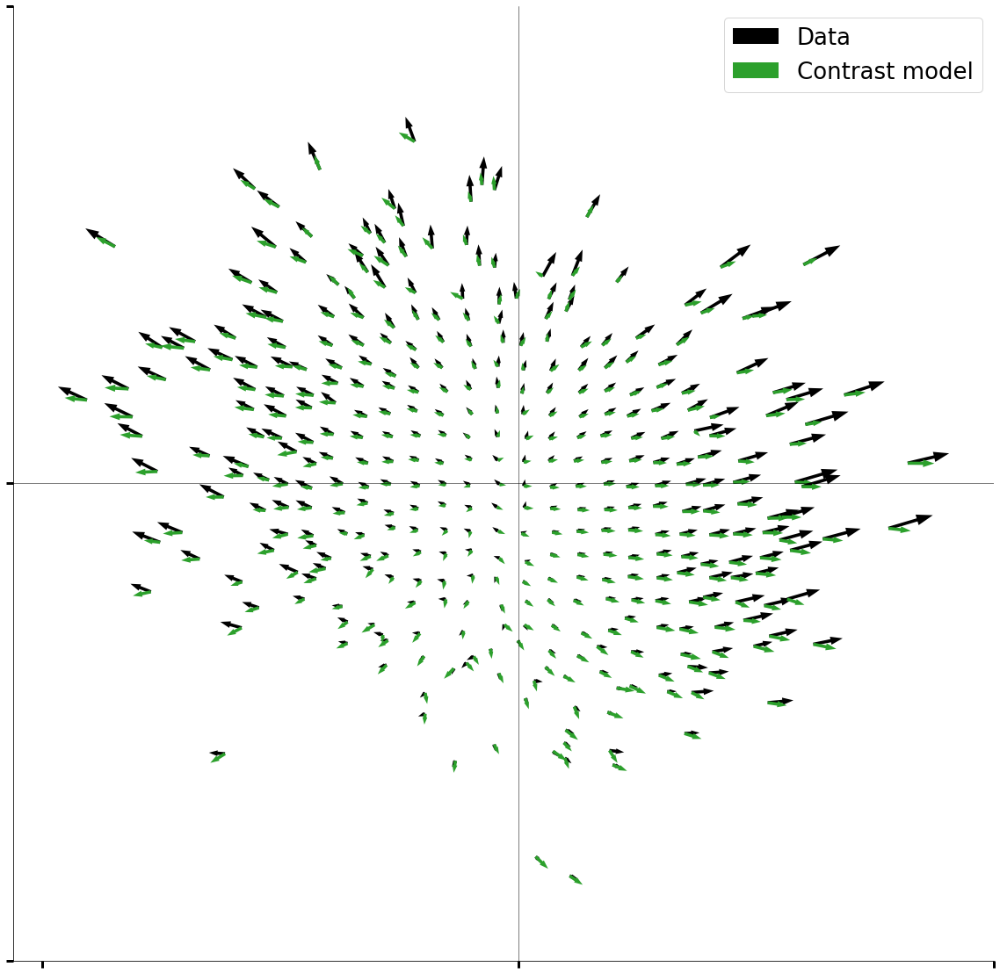

...

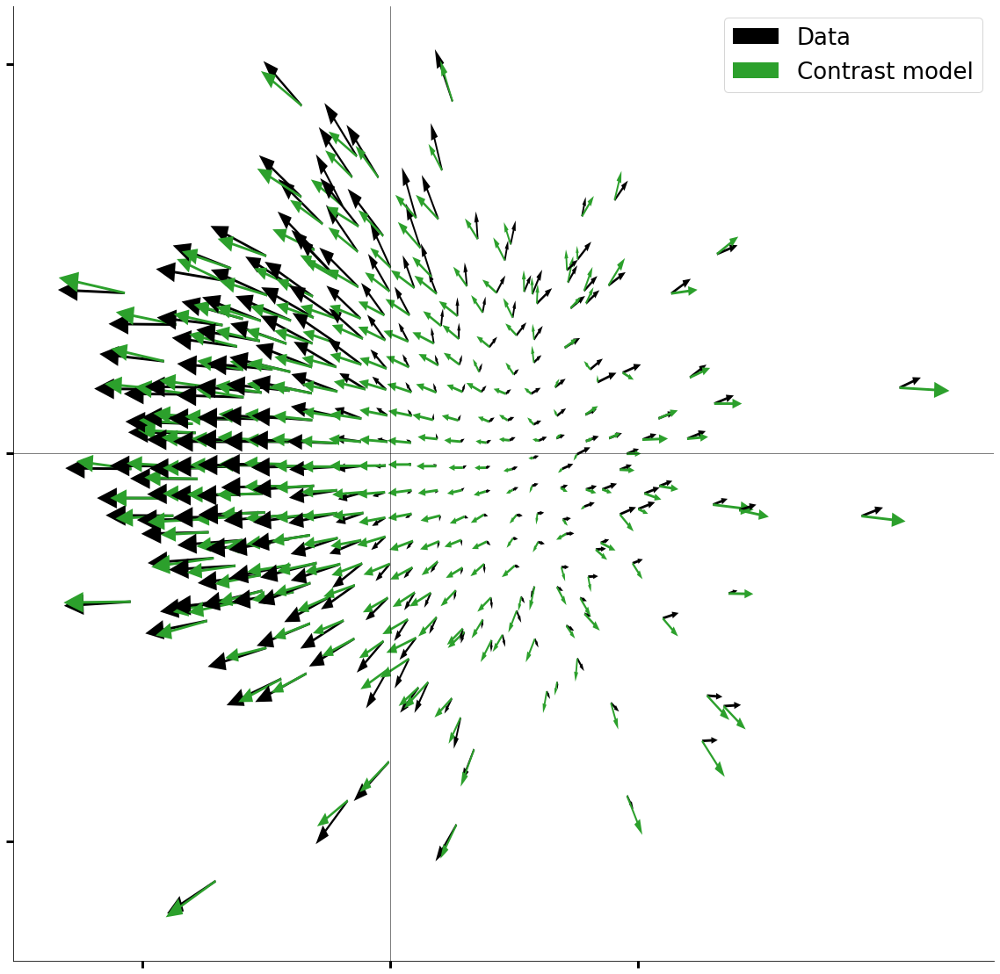

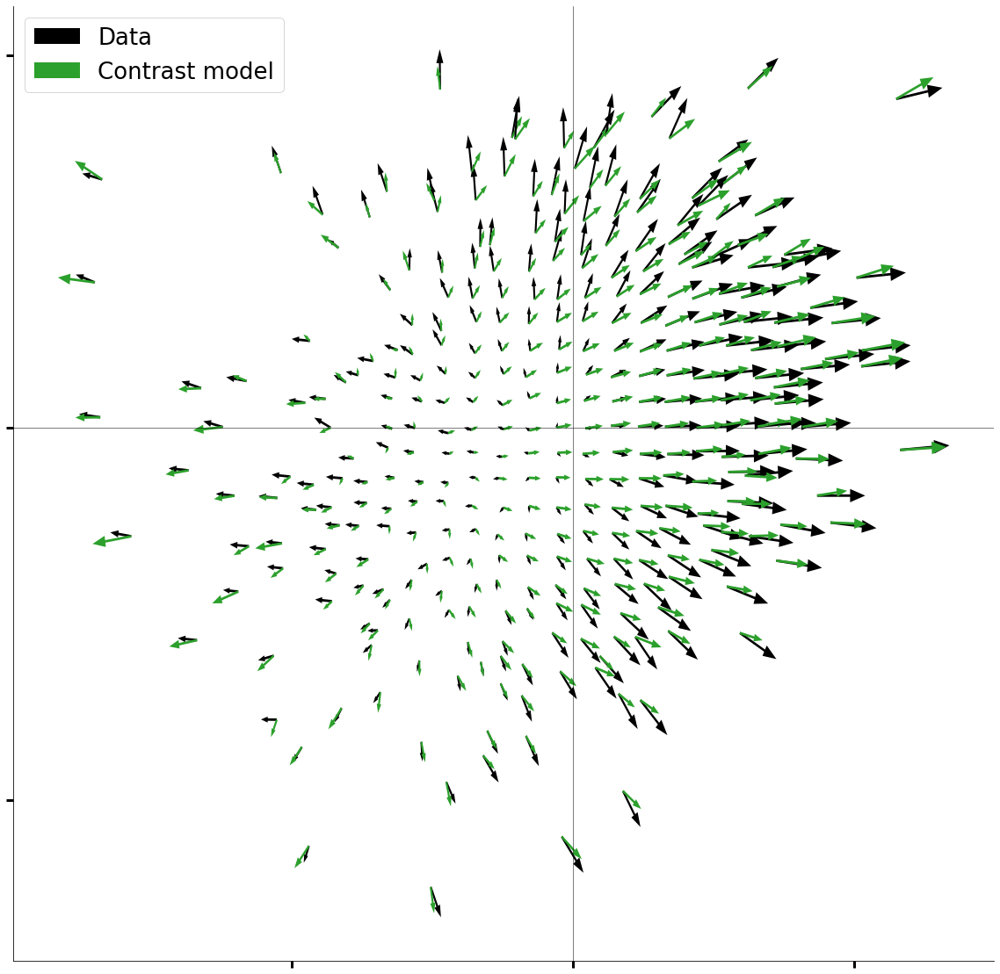

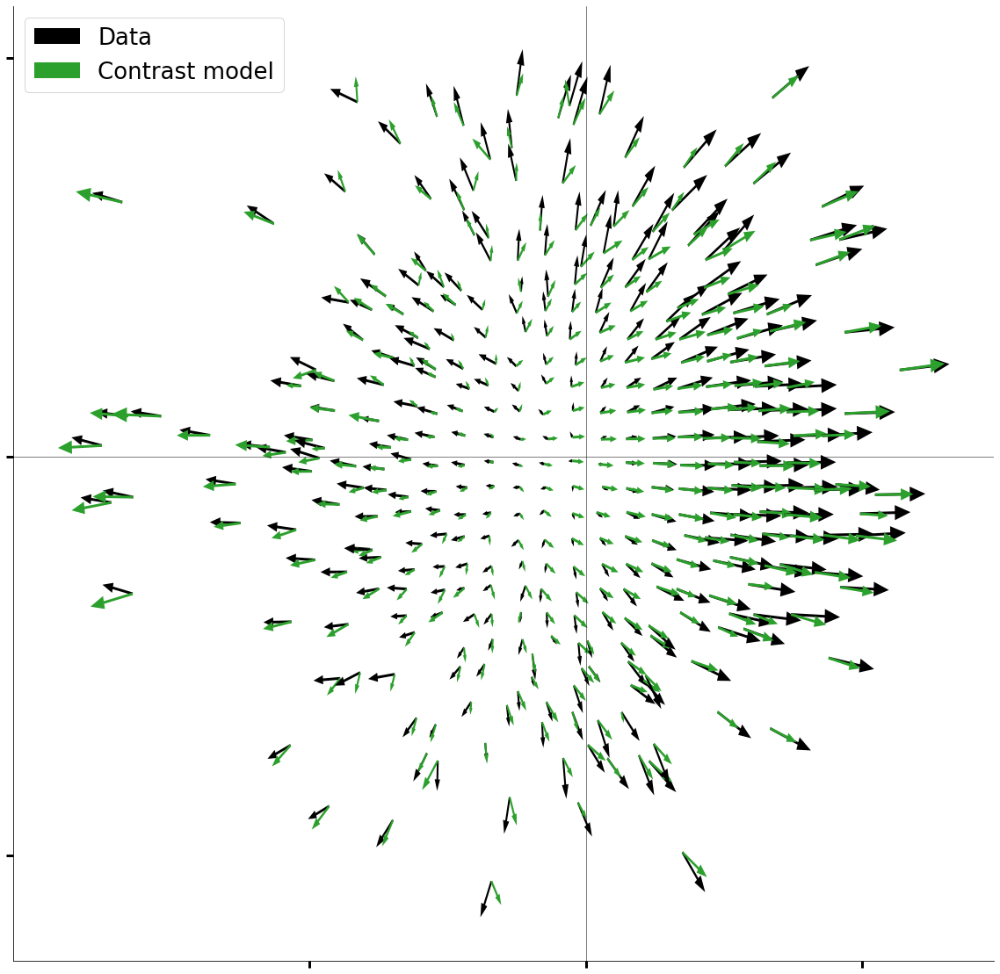

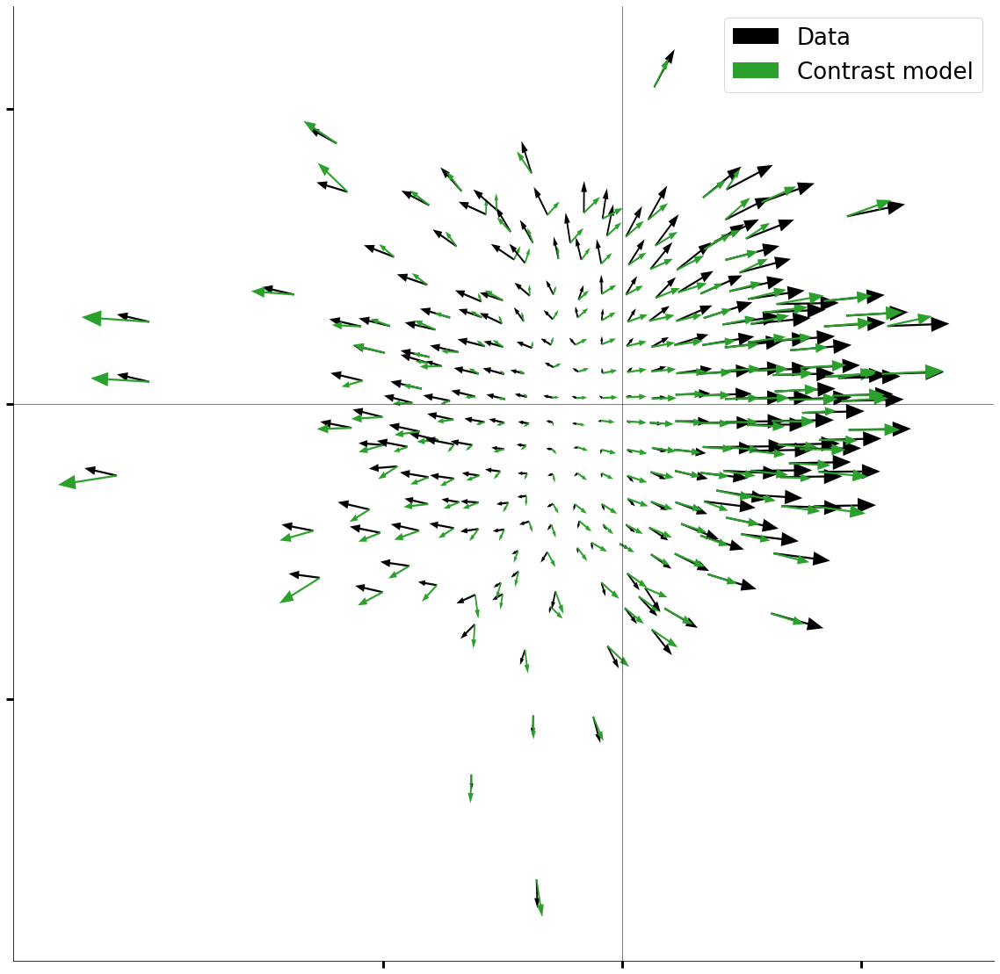

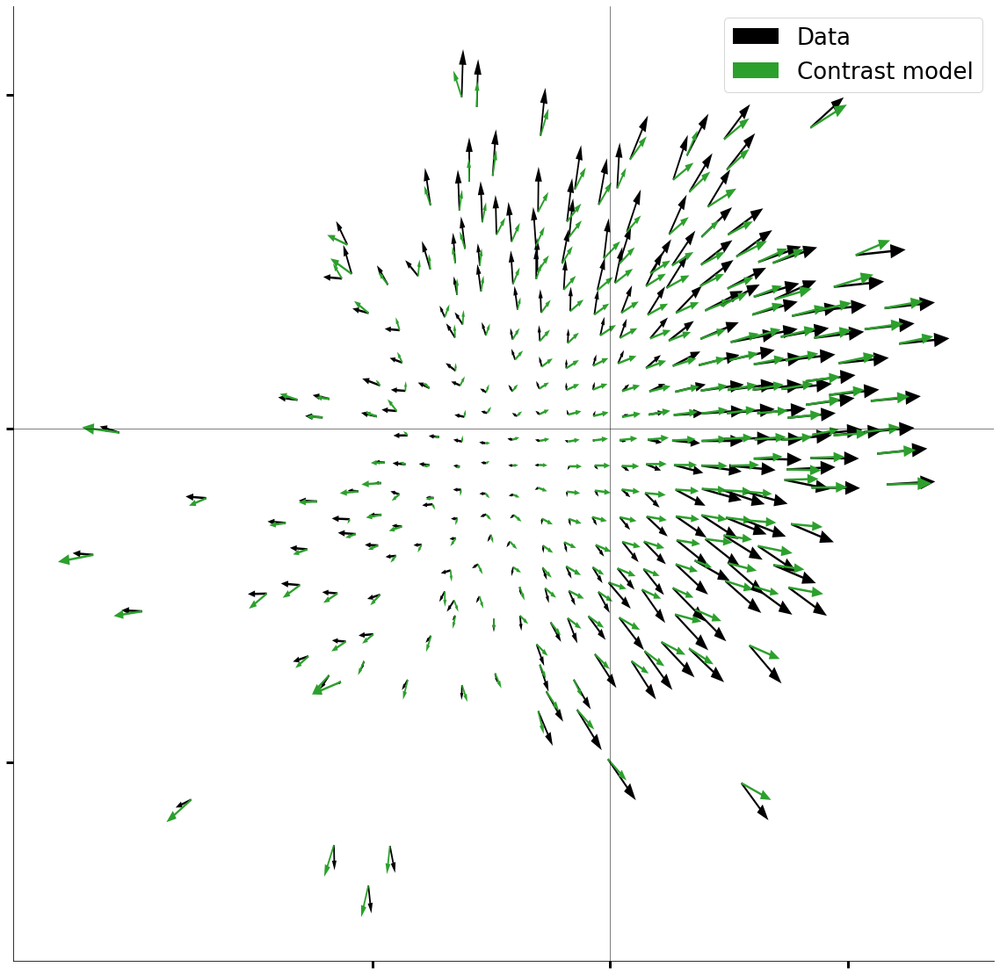

In [51]:
Plotting_folder='/home/samuele/Data_analysis/Contrast_Model_output/'
#the folder in which the plot is to be saved
for exp in [11,13,17,19,101,102]:

    # for each experiment, load the dataset
    if exp==11: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_11/analysis/data2_12mixed_tr19.pkl")
    #if exp==12: dataset = Dataset.load("/media/eqs8/Samuele_01/Exp_12/analysis/data2_32mixed_tr21.pkl")
    if exp==13: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_13/analysis/data2_select_tr1.pkl")
    if exp==17: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_17/analysis/data2_41mixed_tr28.pkl")
    if exp==19: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_19/analysis/data2_28mixed_tr35.pkl")
    if exp==101: dataset = Dataset.load("/media/samuele/BC_Samuele/20190523_goodone/analyses/flashed_images/fi/data.pkl")
    if exp==102: dataset = Dataset.load("/media/samuele/Samuele_01/Salamander2/data2_23mixed_tr34.pkl")

    dataset.select_cells('all')
    train_x, train_y = dataset.train()
    val_x, val_y = dataset.val()
    test_x, test_y = dataset.test(averages=False)

    #here I reshape the pickle outputs that have a weird 1
    train_x=train_x[:,:,:,0]
    val_x=val_x[:,:,:,0]
    test_x=test_x[:,:,:,0]

    #for each experiment, load the predicted lstas on the traing set (previously generate through the script baseline_cnn_analyze.py)
    if exp==11: results_folder= "/media/samuele/Samuele_01/Exp_11/analysis/cnn_12mixed_tr19/run_019"
    #if exp==12: results_folder= '/media/eqs8/Samuele_01/Exp_12/analysis/cnn_32mixed_tr21/run_060/'
    if exp==13: results_folder= '/media/samuele/Samuele_01/Exp_13/analysis/cnn_9OFF_tr1/run_097/'
    if exp==17: results_folder= '/media/samuele/Samuele_01/Exp_17/analysis/cnn_41mixed_tr28_repeat/run_026'
    if exp==19: results_folder="/media/samuele/Samuele_01/Exp_19/analysis/cnn_28mixed_tr35/run_019"
    if exp==101:results_folder= '/media/samuele/BC_Samuele/20190523_goodone/analyses/cnn_sys_ident/20200616_025316/run_075/'
    if exp==102:results_folder='/media/samuele/Samuele_01/Salamander2/cnn_23mixed_tr34/run_030'

    train_lstas=np.load(os.path.join(results_folder, 'train_lstas.npy'))

    #for each experiment now I have to have a list of inverting cells and iterate over them

    #the cells indexes listed here are of the ones that were observed by eye to invert
    if exp==11: inverting_cells_idx=[2,10] #68,388
    if exp==13: inverting_cells_idx=[1,6]  #186,634
    if exp==17: inverting_cells_idx=[1,5,6,7,10,12,14,15,16,17,19,21,26,28,29,30,31,32,33,36,37,39]
                                    #30,116,177,262,339,376,412,515,553,561,680,754,862,892,910,960,962,991,994,1009,1014,1031
    if exp==19: inverting_cells_idx=[0,1,2,3,4,12,24] #6,33,44,65,79,237,435
    if exp==101:inverting_cells_idx=[3,5,6,11,19]  #821,842,871,903
    if exp==102:inverting_cells_idx=[2,7,9,12] #999,1029,1046,1055
    #41 cells

    for inv_idx in tqdm(inverting_cells_idx):
        #Let's focus on a cell. Each cell has a separate contrast model
        base=train_lstas[inv_idx]
        LSTAs_set=base.reshape(base.shape[0], base.shape[1]*base.shape[2])
        #do a PCA on the collection of the predicted LSTAs for the single cell
        pca = PCA(n_components=2)
        pca.fit(LSTAs_set)
        #project all the images of the training set on the first two PCs
        PC1=pca.components_[0]
        PC2=pca.components_[1]

        resh_training=train_x.reshape(train_x.shape[0], train_x.shape[1]*train_x.shape[2])
        project=[]
        for image in resh_training:
            project.append([np.dot(PC1,image),np.dot(PC2,image)])
        project=np.array(project)    
        pt_x=project[:,0]  #the projection values of each image on PC1
        pt_y=project[:,1]  #the projection values of each image on PC2

    #     #project also the LSTAs on the same components
    #     arrowheads=[]
    #     for image in LSTAs_set:
    #         arrowheads.append([np.dot(PC1,image),np.dot(PC2,image)])
    #     arrowheads=np.array(arrowheads)
    #     dx=arrowheads[:,0]  #the projection values of each LSTA on PC1
    #     dy=arrowheads[:,1]  #the projection values of each LSTA on PC2

        #principal components space discretization. I bin the images (and the corresponding LSTAs) averaging together
        #the ones whose projection values fall inside a certain bin
        x_bins=31   # of bins (arrows) I want along x    
        y_bins=31   # of bins (arrows) I want along y
        dx=(pt_x.max()-pt_x.min())/x_bins   #bin size of x
        dy=(pt_y.max()-pt_y.min())/y_bins   #bin size of y

        binned_imgs=[]
        binned_lstas=[]
        for x_tick in range(x_bins):
            x_val=pt_x.min()+x_tick*dx
            for y_tick in range(y_bins):
                y_val=pt_y.min()+y_tick*dy
                temp_img=np.zeros((108,108))
                temp_lsta=np.zeros((108,108))
                nb=0
                for i,img in enumerate(project):
                    if x_val<=img[0]<x_val+dx and y_val<=img[1]<y_val+dy:
                        temp_img+=train_x[i]
                        temp_lsta+=base[i]
                        nb+=1
                if nb==0:
                    continue
        #             binned_imgs.append(np.zeros((108,108)))
        #             binned_lstas.append(np.zeros((108,108)))
                else:
                    binned_imgs.append(temp_img/nb)
                    binned_lstas.append(temp_lsta/nb)
        binned_imgs=np.array(binned_imgs)
        binned_lstas=np.array(binned_lstas)

        #just a reshape of the binning output for the scalar product
        resh_binned_imgs=binned_imgs.reshape(binned_imgs.shape[0],binned_imgs.shape[1]*binned_imgs.shape[2])
        resh_binned_lstas=binned_lstas.reshape(binned_lstas.shape[0],binned_lstas.shape[1]*binned_lstas.shape[2])

        binned_arrowtails=[]
        for bin_img in resh_binned_imgs:
            binned_arrowtails.append([np.dot(PC1,bin_img),np.dot(PC2,bin_img)])
        binned_arrowtails=np.array(binned_arrowtails) #the projection values of the binned images

        binned_arrowheads=[]
        for bin_lsta in resh_binned_lstas:
            binned_arrowheads.append([np.dot(PC1,bin_lsta),np.dot(PC2,bin_lsta)])
        binned_arrowheads=np.array(binned_arrowheads) #the projection values of the binned lstas

        #I use the projections to fit the contrast model so to reproduce best the binned lstas
        #I do a random search for the initialization parameters
        best_vals6=random_search(contrast_model_lstas_2,binned_imgs,binned_lstas.flatten(),10)

        #I use the fitted contrast model to predict a new set of LSTAs (as the contrast model derivative)
        ctr_lastas6=contrast_model_lstas(binned_imgs,*best_vals6[:-1])
        mod6_lasta_set=ctr_lastas6.reshape(ctr_lastas6.shape[0], ctr_lastas6.shape[1]*ctr_lastas6.shape[2])
        model_arrows6=[]
        #and I project these new lstas on the same two PCs
        for ctr_lsta in mod6_lasta_set:
            model_arrows6.append([np.dot(PC1,ctr_lsta),np.dot(PC2,ctr_lsta)])
        model_arrows6=np.array(model_arrows6)

        dx_mod6=model_arrows6[:,0] #proj values of the contrast-model-predicted lstas along PC1
        dy_mod6=model_arrows6[:,1] #proj values of the contrast-model-predicted lstas along PC2
        

        min_arrow=0.1
        mult_arrow=0.35
        arrowsize=1.5
        #arrowwidht=
        fig, ax = plt.subplots(figsize=(20,20))
        #plt.figure(figsize=(20,15))
        for i,j in enumerate(binned_arrowtails[:,0]):
            if i==0:
                ax.arrow(j,binned_arrowtails[i,1],binned_arrowheads[i,0]*arrowsize,binned_arrowheads[i,1]*arrowsize,width=0.08,color='black',head_width=min_arrow+mult_arrow*np.sqrt(binned_arrowheads[i,0]**2+binned_arrowheads[i,1]**2),lw=0,label='Data')
                ax.arrow(j,binned_arrowtails[i,1],dx_mod6[i]*arrowsize,dy_mod6[i]*arrowsize,width=0.08, color='C2',head_width=min_arrow+mult_arrow*np.sqrt(dx_mod6[i]**2+dy_mod6[i]**2),lw=0,label='Contrast model')
            else:
                ax.arrow(j,binned_arrowtails[i,1],binned_arrowheads[i,0]*arrowsize,binned_arrowheads[i,1]*arrowsize,width=0.08,color='black',head_width=min_arrow+mult_arrow*np.sqrt(binned_arrowheads[i,0]**2+binned_arrowheads[i,1]**2), lw=0,label=None)
                ax.arrow(j,binned_arrowtails[i,1],dx_mod6[i]*arrowsize,dy_mod6[i]*arrowsize,width=0.08, color='C2',head_width=min_arrow+mult_arrow*np.sqrt(dx_mod6[i]**2+dy_mod6[i]**2), lw=0,label=None)


        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.legend(prop={'size': 26})
        ax.axvline(0,color='k',lw=0.5)
        ax.axhline(0,color='k',lw=0.5)
        ax.set_xticks([-12,0,12])
        ax.set_xticklabels(['','',''])
        ax.set_yticks([-12,0,12])
        ax.set_yticklabels(['','',''])
        ax.xaxis.set_tick_params(size=8,width=3)
        ax.yaxis.set_tick_params(size=8,width=3)

        #fig.tight_layout()
        fig.savefig(Plotting_folder+'Arrowgraph_cell{0}_Exp{1}'.format(inv_idx,exp),format='pdf')
        #plt.show()





In [32]:
np.dot(PC1,image)

0.18258008

# A cell that computes the average variance explained by the first two pca components across inverting cells

In [87]:
explained_variance=[]
for exp in [11,13,17,19,101,102]:

    # for each experiment, load the dataset
    if exp==11: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_11/analysis/data2_12mixed_tr19.pkl")
    #if exp==12: dataset = Dataset.load("/media/eqs8/Samuele_01/Exp_12/analysis/data2_32mixed_tr21.pkl")
    if exp==13: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_13/analysis/data2_select_tr1.pkl")
    if exp==17: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_17/analysis/data2_41mixed_tr28.pkl")
    if exp==19: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_19/analysis/data2_28mixed_tr35.pkl")
    if exp==101: dataset = Dataset.load("/media/samuele/BC_Samuele/20190523_goodone/analyses/flashed_images/fi/data.pkl")
    if exp==102: dataset = Dataset.load("/media/samuele/Samuele_01/Salamander2/data2_23mixed_tr34.pkl")

    dataset.select_cells('all')
    train_x, train_y = dataset.train()
    val_x, val_y = dataset.val()
    test_x, test_y = dataset.test(averages=False)

    #here I reshape the pickle outputs that have a weird 1
    train_x=train_x[:,:,:,0]
    val_x=val_x[:,:,:,0]
    test_x=test_x[:,:,:,0]

    #for each experiment, load the predicted lstas on the traing set (previously generate through the script baseline_cnn_analyze.py)
    if exp==11: results_folder= "/media/samuele/Samuele_01/Exp_11/analysis/cnn_12mixed_tr19/run_019"
    #if exp==12: results_folder= '/media/eqs8/Samuele_01/Exp_12/analysis/cnn_32mixed_tr21/run_060/'
    if exp==13: results_folder= '/media/samuele/Samuele_01/Exp_13/analysis/cnn_9OFF_tr1/run_097/'
    if exp==17: results_folder= '/media/samuele/Samuele_01/Exp_17/analysis/cnn_41mixed_tr28_repeat/run_026'
    if exp==19: results_folder="/media/samuele/Samuele_01/Exp_19/analysis/cnn_28mixed_tr35/run_019"
    if exp==101:results_folder= '/media/samuele/BC_Samuele/20190523_goodone/analyses/cnn_sys_ident/20200616_025316/run_075/'
    if exp==102:results_folder='/media/samuele/Samuele_01/Salamander2/cnn_23mixed_tr34/run_030'

    train_lstas=np.load(os.path.join(results_folder, 'train_lstas.npy'))

    #for each experiment now I have to have a list of inverting cells and iterate over them

#     #the cells indexes listed here are of the ones that were observed by eye to invert
#     if exp==11: inverting_cells_idx=[2,10] #68,388
#     if exp==13: inverting_cells_idx=[1,6]  #186,634
#     if exp==17: inverting_cells_idx=[1,5,6,7,10,12,14,15,16,17,19,21,26,28,29,30,31,32,33,36,37,39]
#                                     #30,116,177,262,339,376,412,515,553,561,680,754,862,892,910,960,962,991,994,1009,1014,1031
#     if exp==19: inverting_cells_idx=[0,1,2,3,4,12,24] #6,33,44,65,79,237,435
#     if exp==101:inverting_cells_idx=[3,5,11,19]  #821,842,871,903
#     if exp==102:inverting_cells_idx=[2,7,9,12] #999,1029,1046,1055
#     #41 cells
    #Berens invertions   
    if exp==11: inverting_cells_idx=[2] #68
    if exp==13: inverting_cells_idx=[1,6]  #186,634
    if exp==17: inverting_cells_idx=[1,5,10,21,26,28,29,31,32,39] #30,116,339,754,862,892,910,962,991,1031
    if exp==19: inverting_cells_idx=[12] #237
    if exp==101:inverting_cells_idx=[3,5,19]  #842,871
    if exp==102:inverting_cells_idx=[2,7,9,12] #999,1029,1046,1055
    #20 cells

    for inv_idx in tqdm(inverting_cells_idx):
        #Let's focus on a cell. Each cell has a separate contrast model
        base=train_lstas[inv_idx]
        LSTAs_set=base.reshape(base.shape[0], base.shape[1]*base.shape[2])
        #do a PCA on the collection of the predicted LSTAs for the single cell
        pca = PCA(n_components=2)
        pca.fit(LSTAs_set)
        explained_variance.append(np.array(pca.explained_variance_ratio_).sum())

explained_variance=np.array(explained_variance)        
print(explained_variance.shape)        

100%|██████████| 4/4 [00:00<00:00,  4.30it/s]

(20,)


In [90]:
explained_variance.mean(), explained_variance.std()/np.sqrt(explained_variance.size)

(0.87081987, 0.026284890900102824)

## A cell that plots the variance explained by the first principal components averaged over all the cells for Mouse and Salamander

In [2]:
explained_variance_all=[]
for exp in [11,13,17,19,101,102]:

    # for each experiment, load the dataset
    if exp==11: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_11/analysis/data2_12mixed_tr19.pkl")
    #if exp==12: dataset = Dataset.load("/media/eqs8/Samuele_01/Exp_12/analysis/data2_32mixed_tr21.pkl")
    if exp==13: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_13/analysis/data2_select_tr1.pkl")
    if exp==17: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_17/analysis/data2_41mixed_tr28.pkl")
    if exp==19: dataset = Dataset.load("/media/samuele/Samuele_01/Exp_19/analysis/data2_28mixed_tr35.pkl")
    if exp==101: dataset = Dataset.load("/media/samuele/BC_Samuele/20190523_goodone/analyses/flashed_images/fi/data.pkl")
    if exp==102: dataset = Dataset.load("/media/samuele/Samuele_01/Salamander2/data2_23mixed_tr34.pkl")

    dataset.select_cells('all')
    train_x, train_y = dataset.train()
    val_x, val_y = dataset.val()
    test_x, test_y = dataset.test(averages=False)

    #here I reshape the pickle outputs that have a weird 1
    train_x=train_x[:,:,:,0]
    val_x=val_x[:,:,:,0]
    test_x=test_x[:,:,:,0]

    #for each experiment, load the predicted lstas on the traing set (previously generate through the script baseline_cnn_analyze.py)
    if exp==11: results_folder= "/media/samuele/Samuele_01/Exp_11/analysis/cnn_12mixed_tr19/run_019"
    #if exp==12: results_folder= '/media/eqs8/Samuele_01/Exp_12/analysis/cnn_32mixed_tr21/run_060/'
    if exp==13: results_folder= '/media/samuele/Samuele_01/Exp_13/analysis/cnn_9OFF_tr1/run_097/'
    if exp==17: results_folder= '/media/samuele/Samuele_01/Exp_17/analysis/cnn_41mixed_tr28_repeat/run_026'
    if exp==19: results_folder="/media/samuele/Samuele_01/Exp_19/analysis/cnn_28mixed_tr35/run_019"
    if exp==101:results_folder= '/media/samuele/BC_Samuele/20190523_goodone/analyses/cnn_sys_ident/20200616_025316/run_075/'
    if exp==102:results_folder='/media/samuele/Samuele_01/Salamander2/cnn_23mixed_tr34/run_030'

    train_lstas=np.load(os.path.join(results_folder, 'train_lstas.npy'))

    #for each experiment now I have to have a list of inverting cells and iterate over them

#     #the cells indexes listed here are of the ones that were observed by eye to invert
#     if exp==11: inverting_cells_idx=[2,10] #68,388
#     if exp==13: inverting_cells_idx=[1,6]  #186,634
#     if exp==17: inverting_cells_idx=[1,5,6,7,10,12,14,15,16,17,19,21,26,28,29,30,31,32,33,36,37,39]
#                                     #30,116,177,262,339,376,412,515,553,561,680,754,862,892,910,960,962,991,994,1009,1014,1031
#     if exp==19: inverting_cells_idx=[0,1,2,3,4,12,24] #6,33,44,65,79,237,435
#     if exp==101:inverting_cells_idx=[3,5,11,19]  #821,842,871,903
#     if exp==102:inverting_cells_idx=[2,7,9,12] #999,1029,1046,1055
#     #41 cells
    #Berens invertions   
    if exp==11: inverting_cells_idx=[2] #68
    if exp==13: inverting_cells_idx=[1,6]  #186,634
    if exp==17: inverting_cells_idx=[1,5,10,21,26,28,29,31,32,39] #30,116,339,754,862,892,910,962,991,1031
    if exp==19: inverting_cells_idx=[12] #237
    if exp==101:inverting_cells_idx=[3,5,19]  #842,871
    if exp==102:inverting_cells_idx=[2,7,9,12] #999,1029,1046,1055
    #20 cells

    for inv_idx in tqdm(inverting_cells_idx):
        #Let's focus on a cell. Each cell has a separate contrast model
        base=train_lstas[inv_idx]
        LSTAs_set=base.reshape(base.shape[0], base.shape[1]*base.shape[2])
        #do a PCA on the collection of the predicted LSTAs for the single cell
        pca = PCA()  #n_components=2
        pca.fit(LSTAs_set)
        explained_variance_all.append(np.array(pca.explained_variance_ratio_))

explained_variance_all=np.array(explained_variance_all)        
print(explained_variance_all.shape)        

100%|██████████| 4/4 [00:59<00:00, 14.77s/it]

(21, 2910)


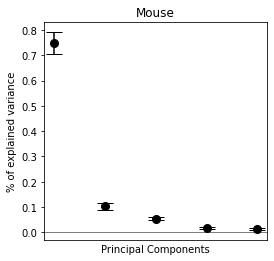

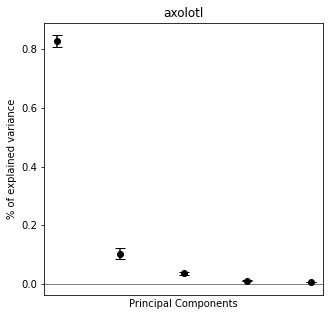

In [63]:
mouse_all=explained_variance_all[:14]
salam_all=explained_variance_all[14:]

mouse_means=mouse_all.mean(axis=0)
salam_means=salam_all.mean(axis=0)
mouse_means.shape, salam_means.shape

mouse_err=mouse_all.std(axis=0)/np.sqrt(mouse_all.shape[0])
salam_err=salam_all.std(axis=0)/np.sqrt(salam_all.shape[0])
mouse_err.shape, salam_err.shape

n_points=5
fig, ax = plt.subplots(figsize=(4,4))
ax.plot(mouse_means[:n_points], 'o', color='black', markersize=8)
for i in range(n_points):
    ax.errorbar(np.linspace(0,10,11)[i],mouse_means[i],yerr=mouse_err[i], ecolor='black', barsabove=False,capsize=8)

#ax.errorbar(np.linspace(0,10,11),mouse_means[:10], 'o', color='C2', yerr=mouse_err[:10])
ax.axhline(0,color='k',lw=0.5)
ax.set_xlabel('Principal Components')
ax.set_ylabel('% of explained variance')
ax.set_xticks([])
ax.set_xticklabels([])
ax.set_title("Mouse")
#ax.set_yticks([])
plt.show()
fig.savefig('/home/samuele/Data_analysis/Figures/spectrum_allmouse.pdf',format='pdf')

fig, ax = plt.subplots(figsize=(5,5))
ax.plot(salam_means[:n_points], 'o', color='black')
for i in range(n_points):
    ax.errorbar(np.linspace(0,10,11)[i],salam_means[i],yerr=salam_err[i], ecolor='black', barsabove=False,capsize=5)

#ax.errorbar(np.linspace(0,10,11),mouse_means[:10], 'o', color='C2', yerr=mouse_err[:10])
ax.axhline(0,color='k',lw=0.5)
ax.set_xlabel('Principal Components')
ax.set_ylabel('% of explained variance')
ax.set_xticks([])
ax.set_xticklabels([])
ax.set_title("axolotl")
#ax.set_yticks([])
plt.show()
fig.savefig('/home/samuele/Data_analysis/Figures/spectrum_allsalam.pdf',format='pdf')

In [28]:
np.linspace(0,10,11)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.])